In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math, scipy, skimage, os
import matplotlib as mpl
import seaborn as sns

mpl.rcParams['font.family'] = 'Calibri'
mpl.rcParams['font.size'] = 12
mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['pdf.fonttype'] = 42

In [2]:
#define some functions
def derivative(array, order=20, mode='edge'):
    array = np.array(array)
    if array.ndim ==2:
        dfdy_ = (array[order:] - array[:-order])/order
        dfdx_ = (array[:, order:] - array[:, :-order])/order

        # boundary conditions
        boundary = int(order/2)
        # dfdy = np.full(array.shape, np.nan)
        # dfdy[boundary:-boundary] = dfdy_
        dfdy = np.pad(dfdy_, pad_width=[[boundary, boundary], [0,0]], mode=mode)
        # dfdx = np.full(array.shape, np.nan)
        # dfdx[:, boundary:-boundary] = dfdx_
        dfdx = np.pad(dfdx_, pad_width=[[0,0],[boundary, boundary]], mode=mode)
        
        return [dfdy, dfdx]
        
    if array.ndim ==1:
        dfdx_ = (array[order:]- array[:-order])/order
        boundary = int(order/2)
        # dfdx = np.full(array.shape, np.nan)
        # dfdx[boundary:-boundary] = dfdx_
        dfdx = np.pad(dfdx_, pad_width=boundary, mode=mode)
        return dfdx

def compute_grads(h): 
    # Get gradients
    hy, hx = derivative(h)
    # Get second derivatives
    hyy, hyx = derivative(hy)
    hxy, hxx = derivative(hx)

    return hx, hy, hxx, (hxy+hyx)/2, hyy


def compute_principal_curvatures(h, h_cutoff = 0, cur_cutoff = -1):
    hx, hy, hxx, hxy, hyy = compute_grads(h)
    
    # Mean curvature formula for a surface z = h(x,y)
    numerator = (1 + hx**2)*hyy - 2*hx*hy*hxy + (1 + hy**2)*hxx
    denominator = 2*(1 + hx**2 + hy**2)**(3/2)
    H = numerator/denominator

    numerator = hxx*hyy - hxy**2
    denominator = (1 + hx**2 + hy**2)**2
    K = numerator/denominator

    mask = (K > cur_cutoff) & (h > h_cutoff)

    k1 = H + np.sqrt(H**2 - K)
    k2 = H - np.sqrt(H**2 - K)

    # k1 = np.where(mask, k1, np.nan)
    # k2 = np.where(mask, k2, np.nan)

    return k1, k2


def distance(point_a, point_b):
    if len(point_a) == 2:
        return math.sqrt((point_a[0] - point_b[0])**2 + (point_a[1] - point_b[1])**2)
    elif len(point_a) == 3:
        return math.sqrt((point_a[0] - point_b[0])**2 + (point_a[1] - point_b[1])**2 + (point_a[2] - point_b[2])**2)

    
def find_the_closest_point(point, points_list):     
    distances = [distance(point, point_list) for point_list in points_list]
    return [distances.index(min(distances)), min(distances)]


def length_of_curve(list_):
    if len(list_) ==3:
        xs, ys, zs = list_
        length = len(xs)
        total_length = 0
        for i in range(1, length):
            p1 = [xs[i],ys[i], zs[i]]
            p2 = [xs[i-1], ys[i-1], zs[i-1]]
            portion = distance(p1, p2)
            total_length += portion
        return total_length
        
    if len(list_) ==2:
        xs, ys = list_
        length = len(xs)
        distances = [0]
        total_length = 0
        total_length_by_frame = [0]
        for i in range(1, length):
            p1 = [xs[i],ys[i]]
            p2 = [xs[i-1], ys[i-1]]
            portion = distance(p1,p2)
            distances.append(portion)
            total_length += portion
            total_length_by_frame.append(total_length)
        return [total_length, np.array(distances), np.array(total_length_by_frame)]
    

# Write a function to create new folder
def create_folder(path):
    isExist = os.path.exists(path) 
    if not isExist:
        os.makedirs(path)


In [3]:
# import the height
height = skimage.io.imread('height.tif')
fs, ys, xs = height.shape

In [4]:
# load the raw data
data_raw = skimage.io.imread('cropped_XIN210822_LSM9001_DCLKegfp_UtrmCherry_e1_f22-50_pro1.tif')
data_raw_max = np.max(data_raw, axis=1)
data2_raw = skimage.io.imread('cropped_XIN210822_LSM9001_DCLKegfp_UtrmCherry_e1_f22-50_pro1_sectionmidy.tif')

In [5]:
top_view_vmin, top_view_vmax = 0, 16000
perpsec_view_vmin, perpsec_view_vmax = 0, 12000

pixel_size = 1.2479
voxel_depth = 3
time_interval = 47
fs, zs, ys, xs = data_raw.shape
hs = round(zs*voxel_depth/pixel_size)

In [6]:
f_m1 = 9 -22 #30
f_ck = 24-22
f_m2 = 38-22 #55
f_septum1 = 41-22  

dev_time = (np.arange(0, fs) - f_m2) / (f_m2 - f_m1) * (55 - 30) +55
# dev_time = np.round(dev_time, 1)
print(dev_time)

frames_to_show_in_figure1 = np.array([24,29,34,40,45,50])-22

[41.20689655 42.06896552 42.93103448 43.79310345 44.65517241 45.51724138
 46.37931034 47.24137931 48.10344828 48.96551724 49.82758621 50.68965517
 51.55172414 52.4137931  53.27586207 54.13793103 55.         55.86206897
 56.72413793 57.5862069  58.44827586 59.31034483 60.17241379 61.03448276
 61.89655172 62.75862069 63.62068966 64.48275862 65.34482759]


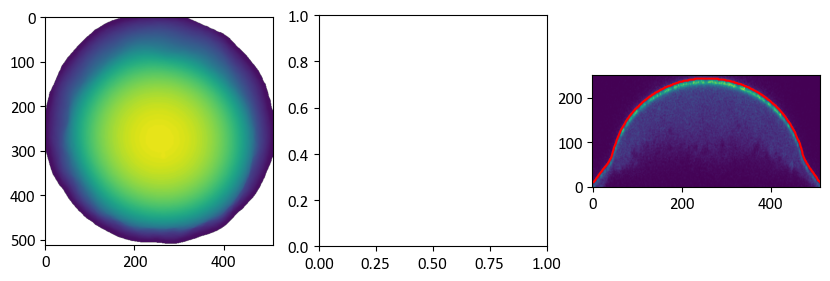

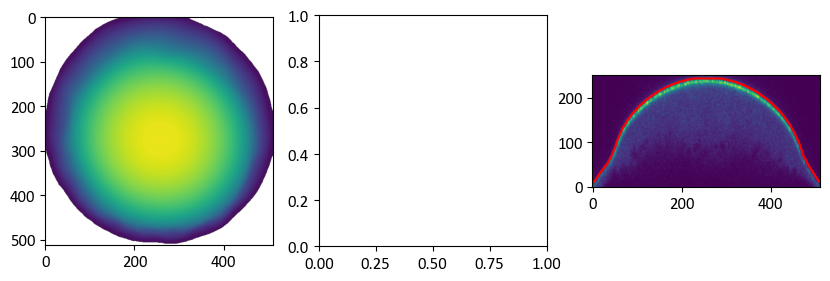

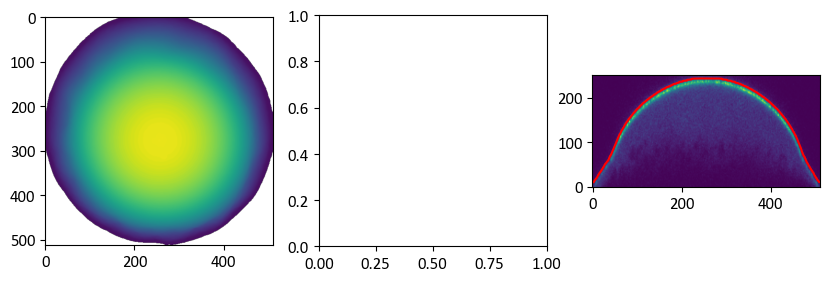

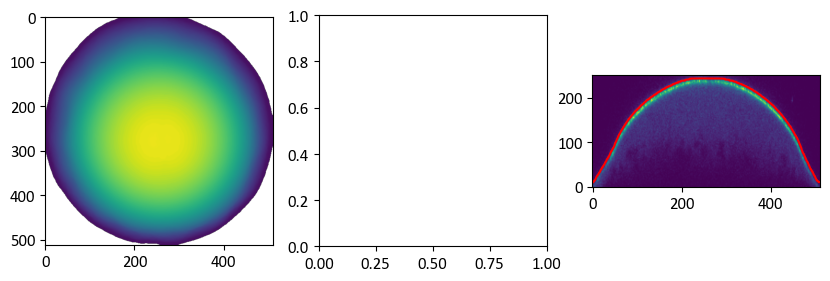

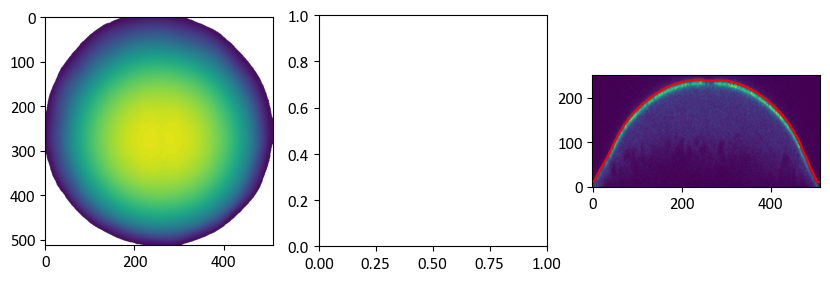

...

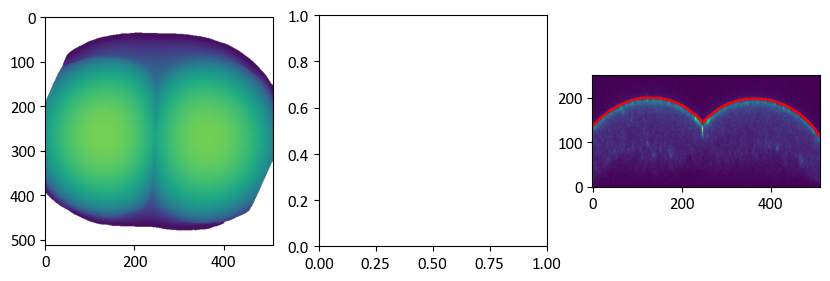

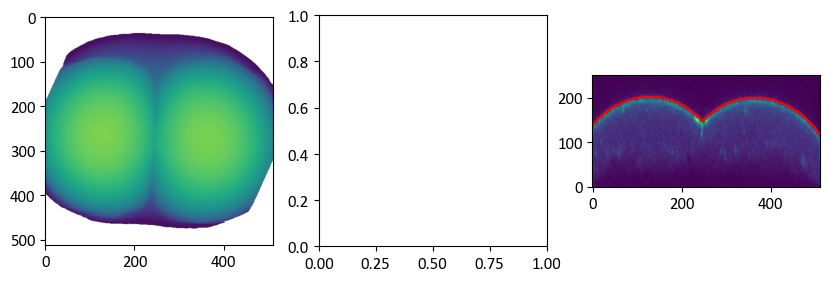

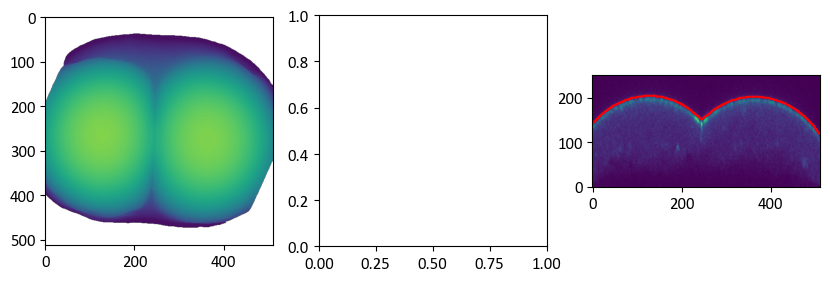

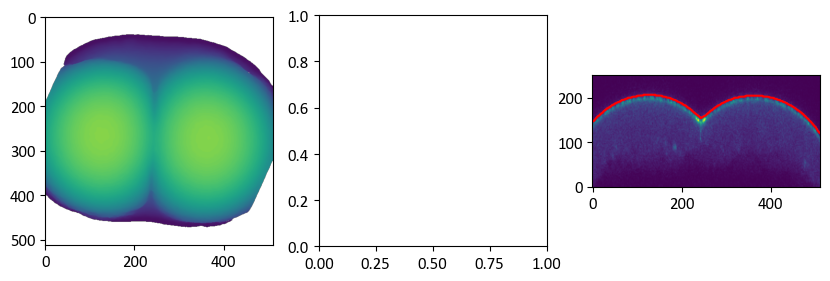

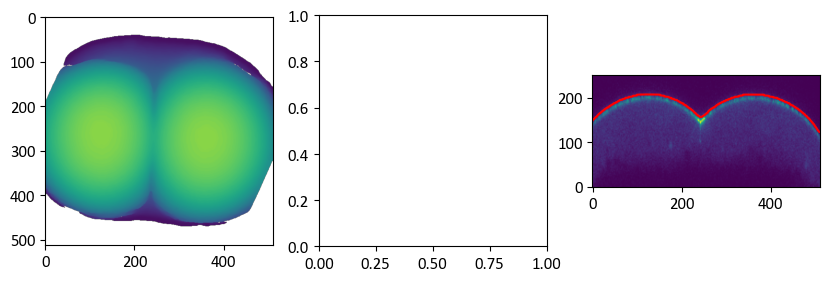

In [7]:
from skimage.transform import rescale
for f in range(fs):
    fig, [ax, ax1, ax2] = plt.subplots(1,3,figsize=[10,3])
    ax.imshow(height[f], vmin=0, vmax=hs)
    ax2.plot(height[f][int(ys/2), :], color='red')
    ax2.imshow(rescale(data_raw[f,:,int(ys/2)], [voxel_depth/pixel_size, 1]))
    ax2.invert_yaxis()
    plt.show()

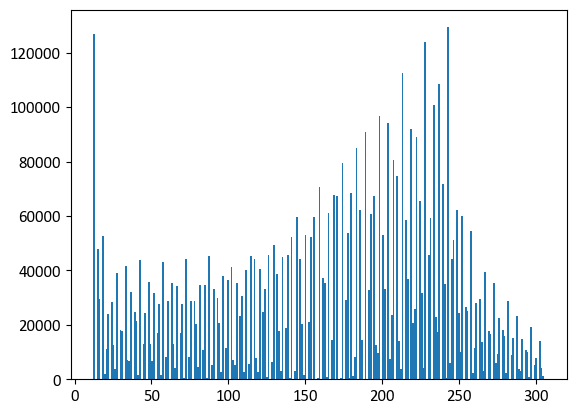

In [8]:
hist_height = plt.hist(height.flatten() * pixel_size, bins=256)
plt.show()

C:\Users\xtong\AppData\Local\Temp\ipykernel_10376\1374239618.py:7: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  plt.savefig('height_colorbar.svg')
c:\Users\xtong\AppData\Local\miniforge3\envs\xint\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


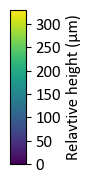

In [10]:
fig, ax = plt.subplots(figsize=(0.2, 2), layout='constrained')
fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=levels[0], vmax=levels[-1]),
                                   cmap='viridis'),
                                   cax=ax, orientation='vertical')
ax.set_ylabel('Relavtive height (\u03BCm)', fontsize=12)
ax.set_yticks(np.arange(0,330,50))
plt.savefig('height_colorbar.svg')

In [11]:
# calculate the two principal curvatures
k1 = np.empty_like(height)
k2 = np.empty_like(height)

for f in range(fs):
    print('frame', f)
    h = height[f] 
    # sigma=1
    # h_smooth = gaussian_filter(h, sigma=sigma)
    h_smooth = h
    
    k1[f], k2[f] = compute_principal_curvatures(h_smooth, h_cutoff=0, cur_cutoff=0)
    # k1[f, :sigma*2, :] =np.nan
    # k1[f, -sigma*2:, :] =np.nan
    # k1[f, :, :sigma*2] =np.nan
    # k1[f, :, -sigma*2:] =np.nan
    # k2[f, :sigma*2, :] =np.nan
    # k2[f, -sigma*2:, :] =np.nan
    # k2[f, :, :sigma*2] =np.nan
    # k2[f, :, -sigma*2:] =np.nan

skimage.io.imsave("k1.tif", k1)
skimage.io.imsave("k2.tif", k2)

frame 0
frame 1
frame 2
frame 3
frame 4
frame 5
frame 6
frame 7
frame 8
frame 9
frame 10
frame 11
frame 12
frame 13
frame 14
frame 15
frame 16
frame 17
frame 18
frame 19
frame 20
frame 21
frame 22
frame 23
frame 24
frame 25
frame 26
frame 27
frame 28


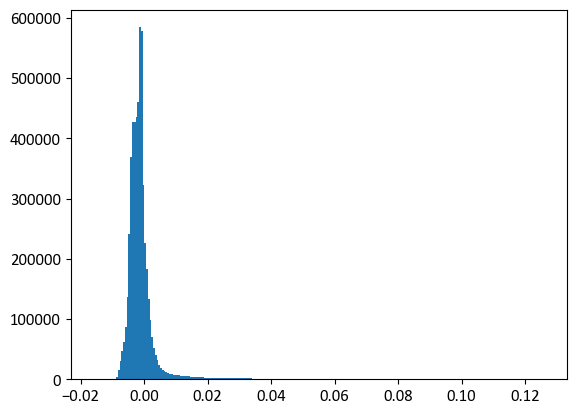

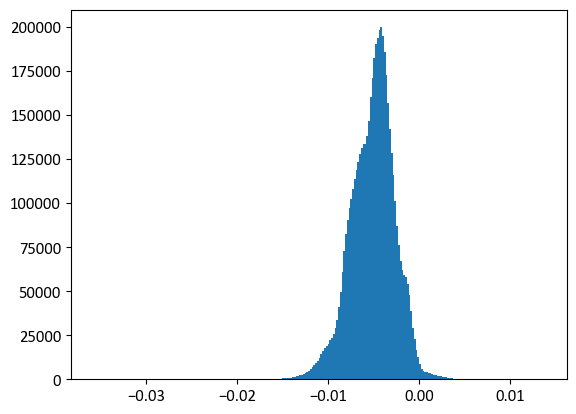

In [12]:
hist1 = plt.hist(k1.flatten()/pixel_size, bins=256)
plt.show()
hist2 = plt.hist(k2.flatten()/pixel_size, bins=256)
plt.show()

final k_range: 0.1
frame 0


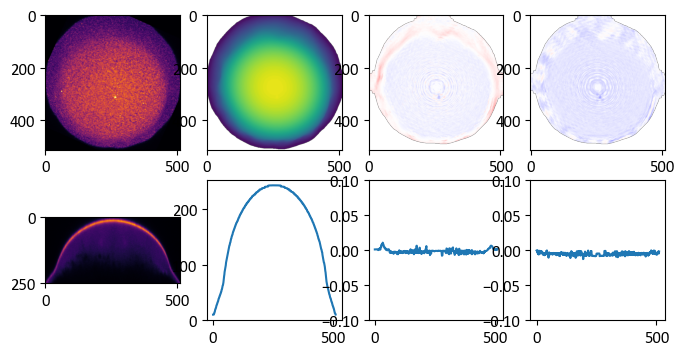

frame 1


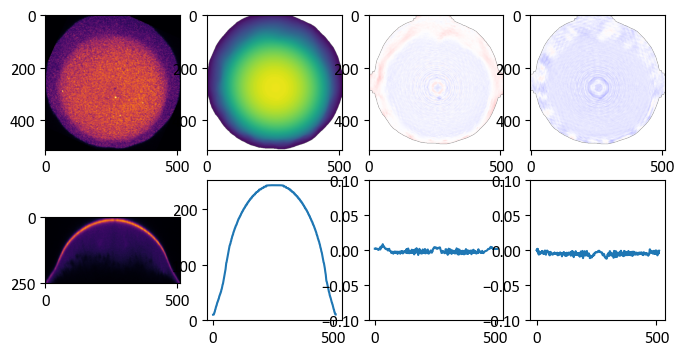

frame 2


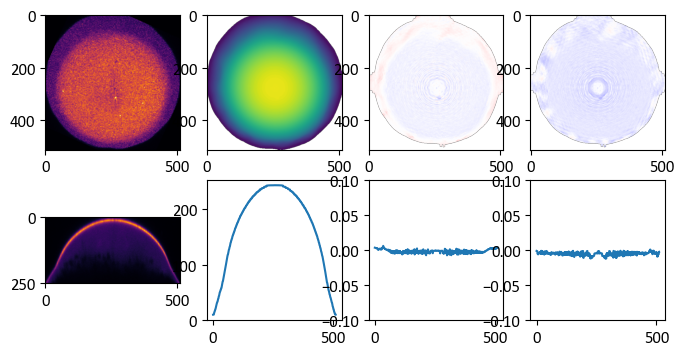

frame 3


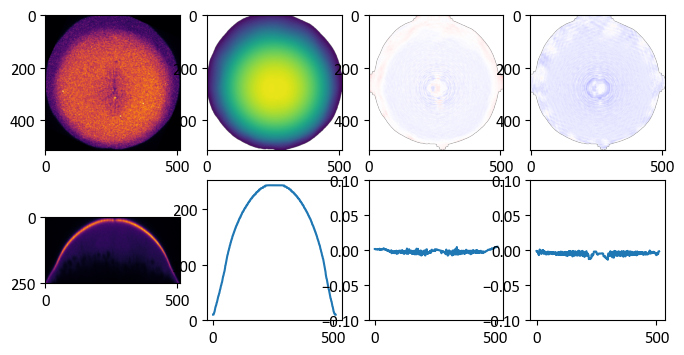

frame 4


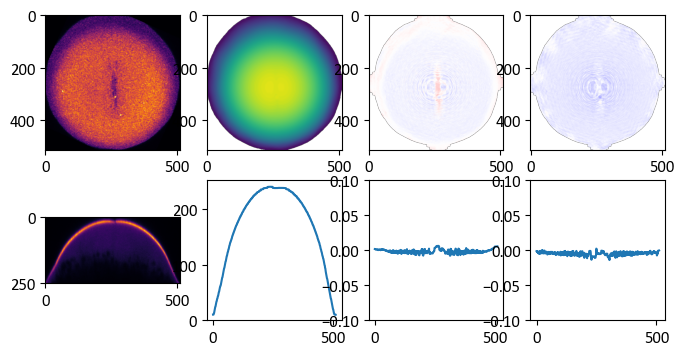

frame 5


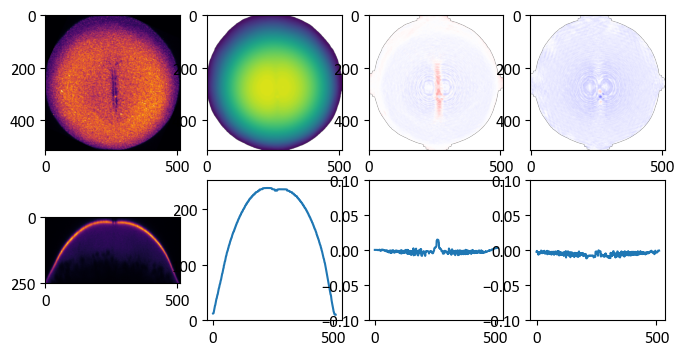

frame 6


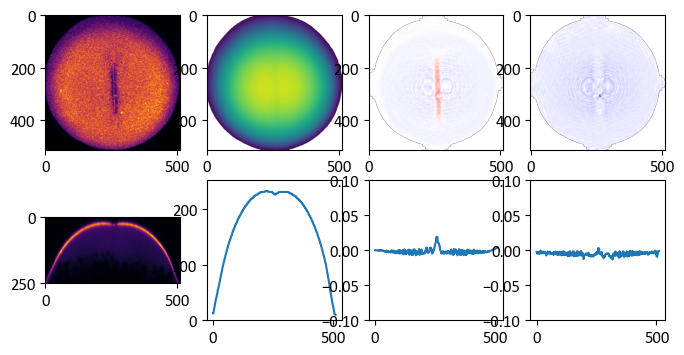

frame 7


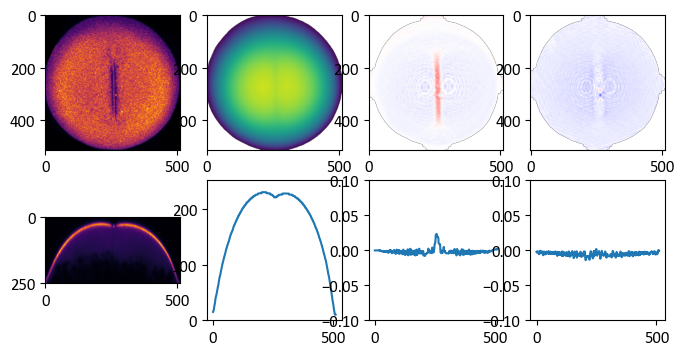

frame 8


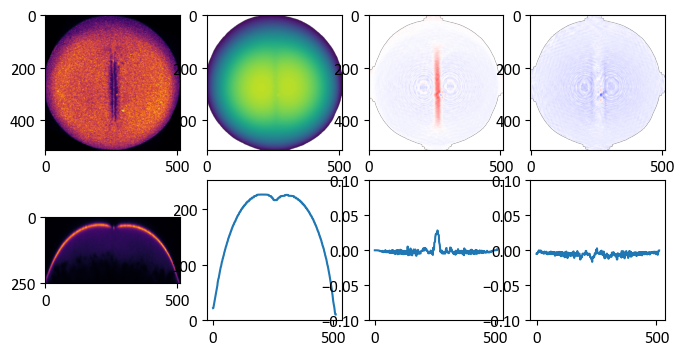

frame 9


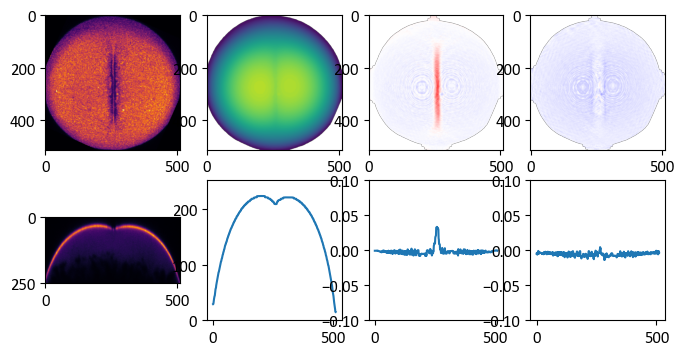

frame 10


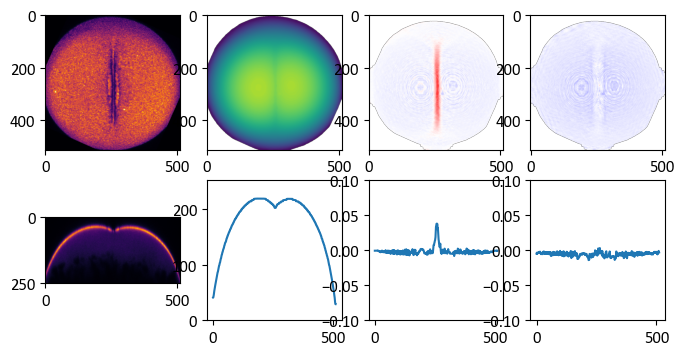

frame 11


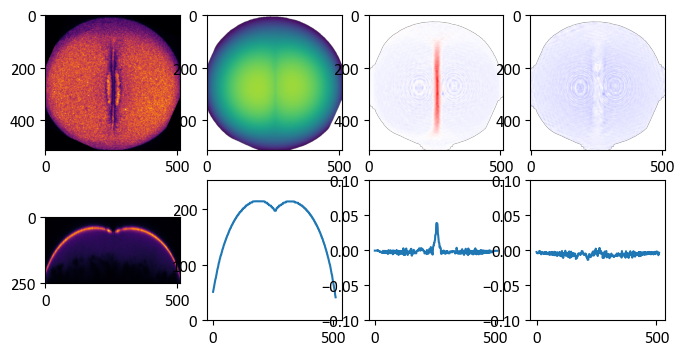

frame 12


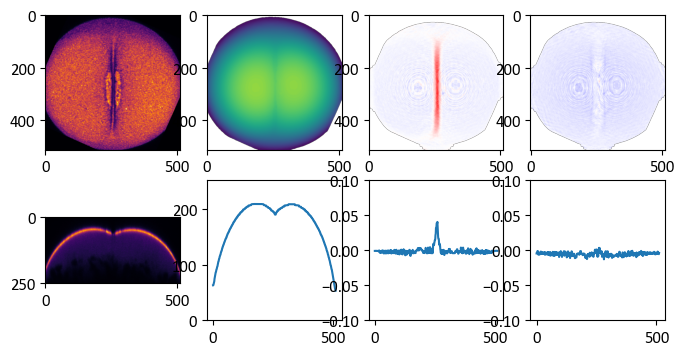

frame 13


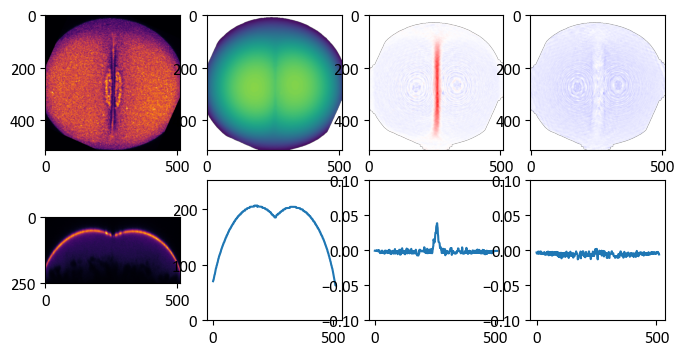

frame 14


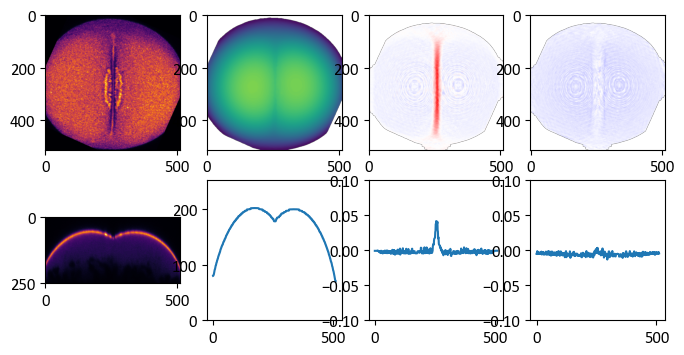

frame 15


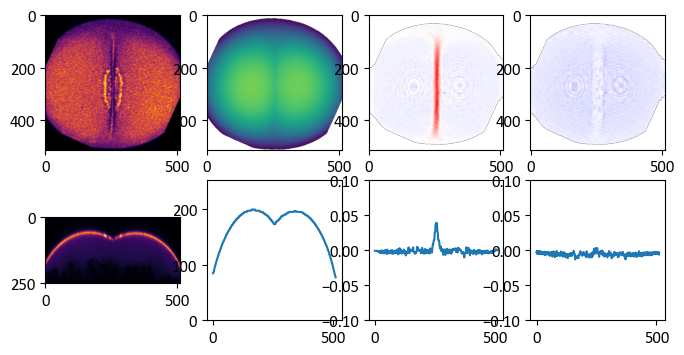

frame 16


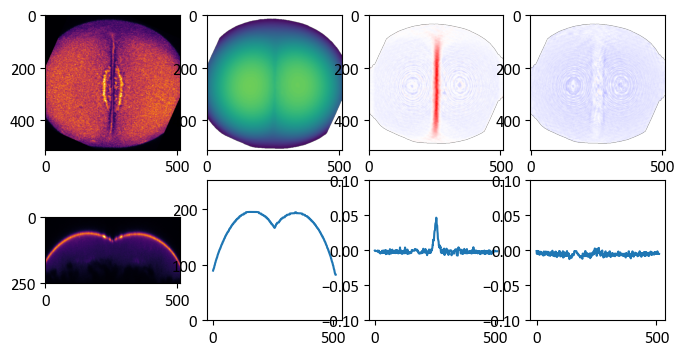

frame 17


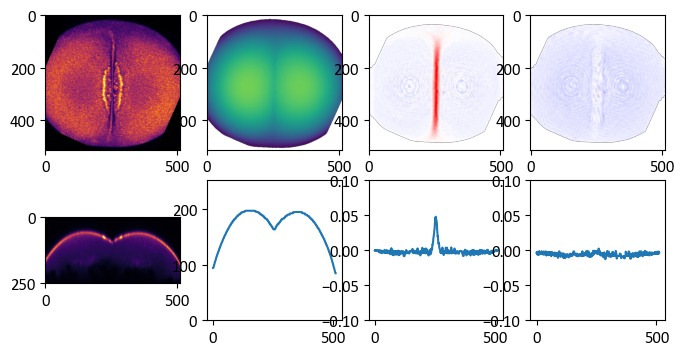

frame 18


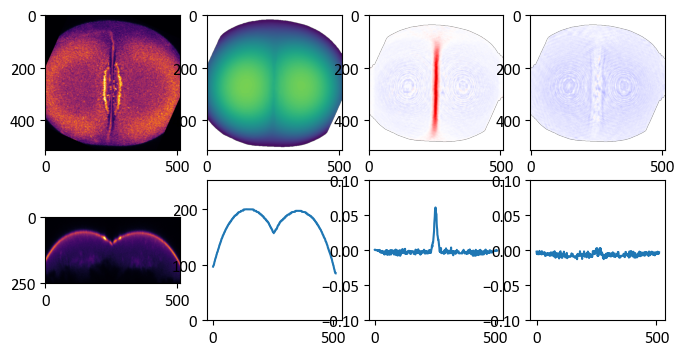

frame 19


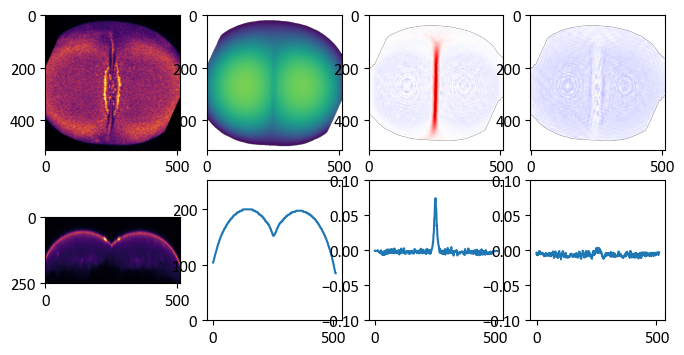

frame 20


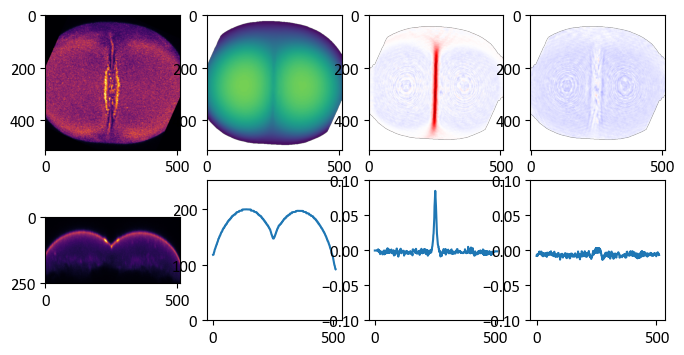

frame 21


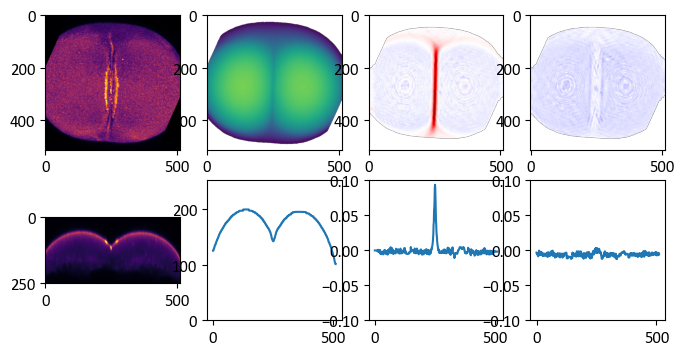

frame 22


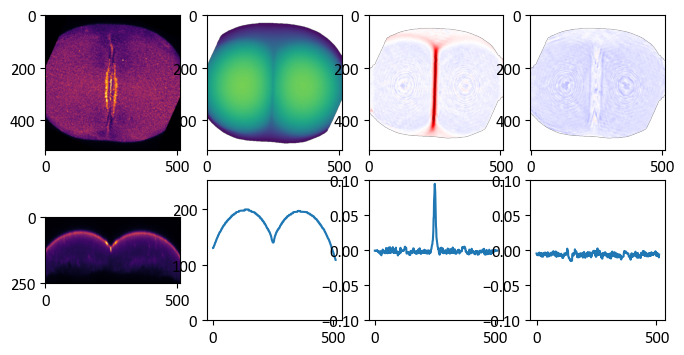

frame 23


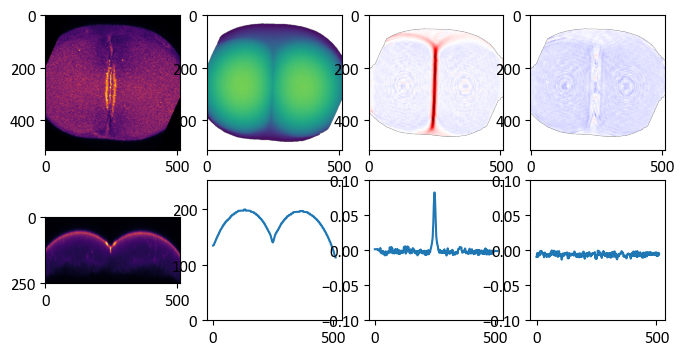

frame 24


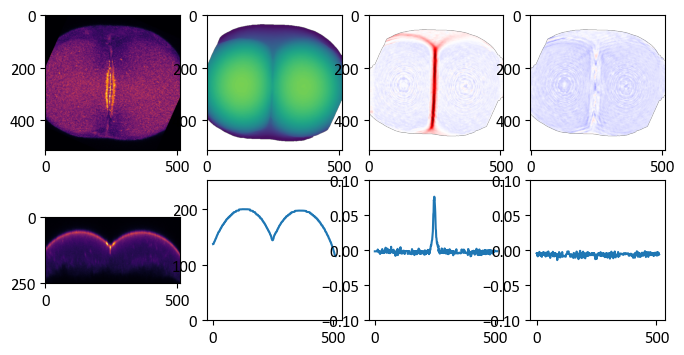

frame 25


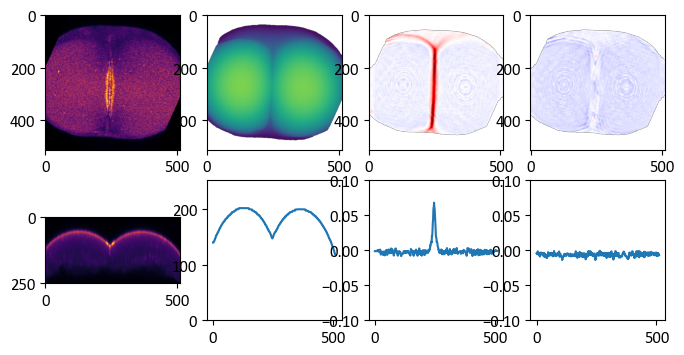

frame 26


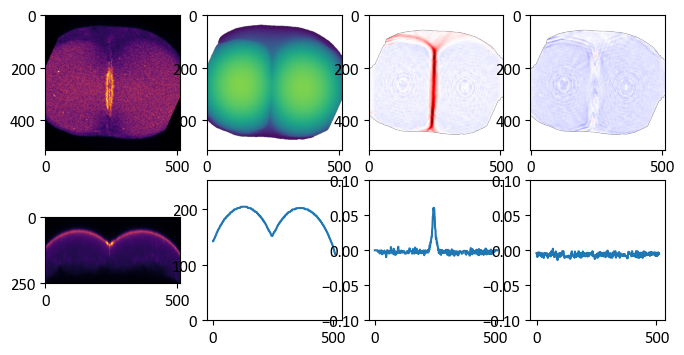

frame 27


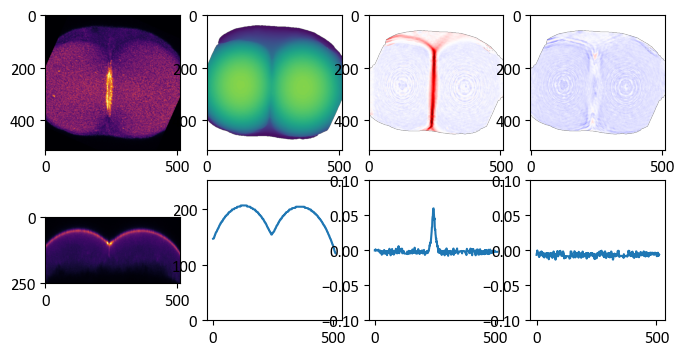

frame 28


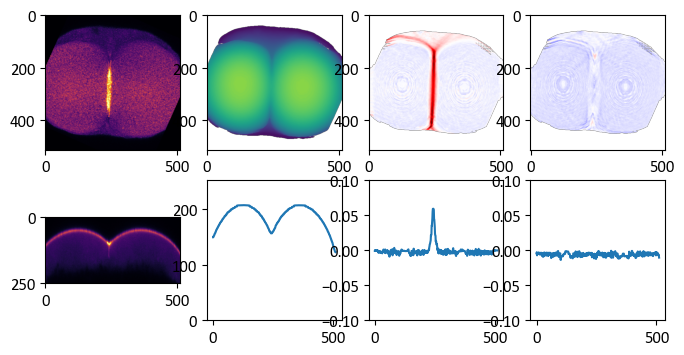

In [13]:
# plot the curvatures
k_range = 0.1
print('final k_range:', k_range)

for f in range(fs):
    print('frame', f)

    h = height[f]
    
    fig, axs = plt.subplots(2,4,figsize=[8,4])
    axs[0,0].imshow(data_raw_max[f], cmap='inferno', vmin=top_view_vmin, vmax=top_view_vmax)
    axs[0,1].imshow(h, vmin=0,vmax=hs)
    axs[0,2].imshow(k1[f]/pixel_size, cmap='seismic', vmin=-k_range, vmax=k_range)
    axs[0,3].imshow(k2[f]/pixel_size, cmap='seismic', vmin=-k_range, vmax=k_range)

    axs[1,0].imshow(data2_raw[f], cmap='inferno', vmin=perpsec_view_vmin, vmax=perpsec_view_vmax)
    axs[1,1].plot(h[256])
    axs[1,1].set_ylim(0,hs)
    axs[1,2].plot(k1[f][256]/pixel_size)
    axs[1,3].plot(k2[f][256]/pixel_size)
    axs[1,2].set_ylim(-k_range, k_range)
    axs[1,3].set_ylim(-k_range, k_range)

    plt.show()

C:\Users\xtong\AppData\Local\Temp\ipykernel_19988\363191938.py:6: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  plt.savefig('k1_curvature_colorbar.svg')
c:\Users\xtong\AppData\Local\miniforge3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


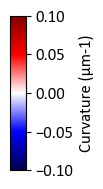

In [14]:
fig, ax = plt.subplots(figsize=(0.2, 2), layout='constrained')
fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=-0.1, vmax=0.1),
                                   cmap='seismic'),
                                   cax=ax, orientation='vertical')
ax.set_ylabel('Curvature (\u03BCm-1)', fontsize=12)
plt.savefig('k1_curvature_colorbar.svg')

In [15]:
## Mark the furrow
# fu_pro, fu_coord
# fu_pro_perp, fu_coord_perp
# fu_pro_center, fu_coord_center

In [11]:
def mask_kymo(mask, image, axis, iterations = 6):
    from scipy.ndimage import binary_dilation
    ys, xs = image.shape
    mask2 = binary_dilation(mask, iterations=iterations)
    
    image_masked = image * mask2
    # fig,ax = plt.subplots()
    # ax.imshow(image_masked)
    # plt.show()
    
    image_masked_oneedge = []
    if axis=='y':
        for y in range(ys):
            image_masked_yslice = image_masked[y]
            image_masked_oneedge.append(image_masked_yslice[mask2[y]==1])
    elif axis=='x':
        for x in range(xs):
            image_masked_xslice = image_masked[:, x]
            image_masked_oneedge.append(image_masked_xslice[mask2[:, x]==1])
            
    image_masked_oneedge = np.array(image_masked_oneedge)
    image_masked = np.nanmean(image_masked_oneedge, axis=1)
    return image_masked

frame 0


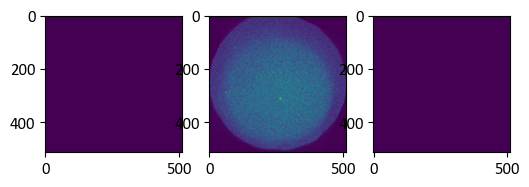

frame 1


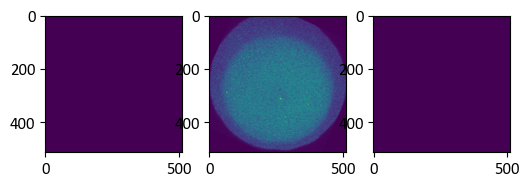

frame 2


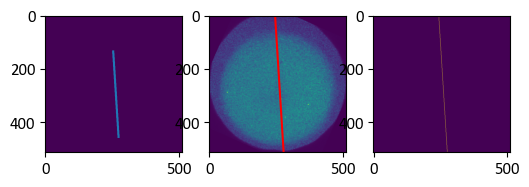

frame 3


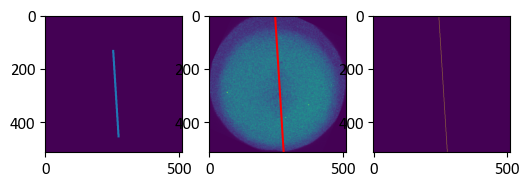

frame 4


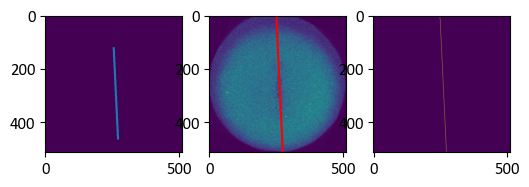

frame 5


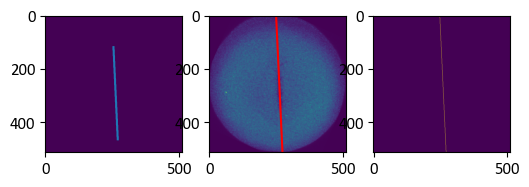

frame 6


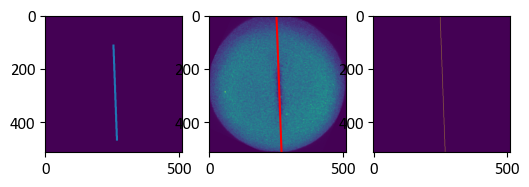

frame 7


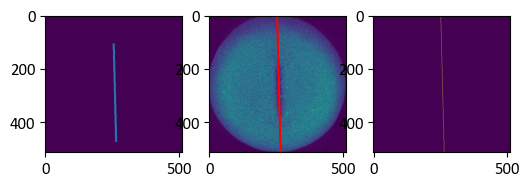

frame 8


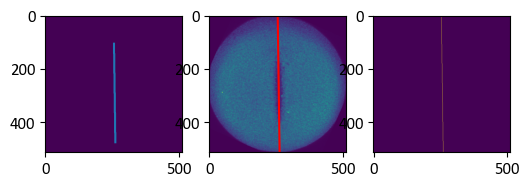

frame 9


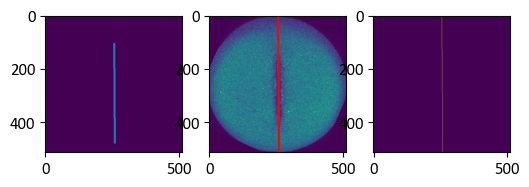

frame 10


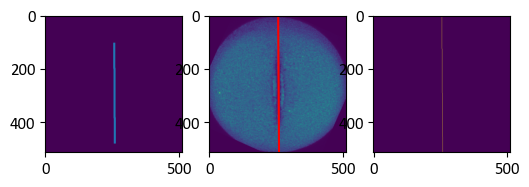

frame 11


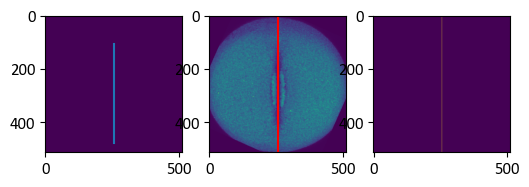

frame 12


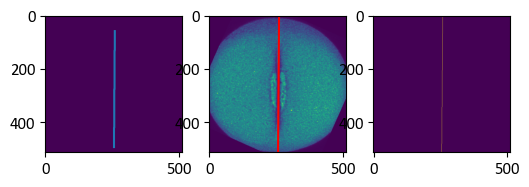

frame 13


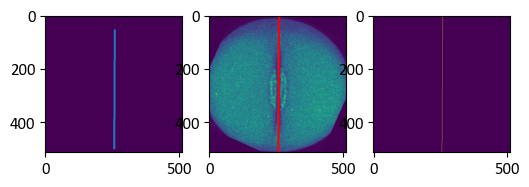

frame 14


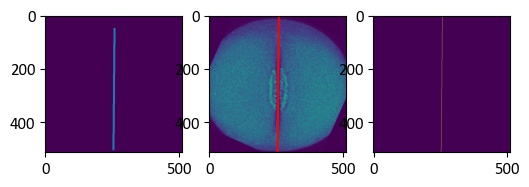

frame 15


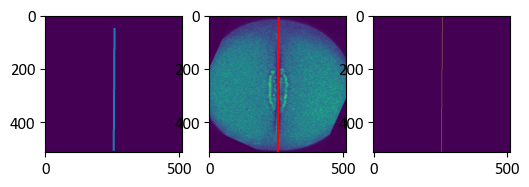

frame 16


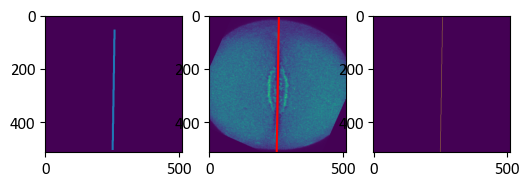

frame 17


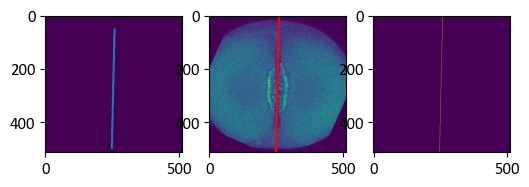

frame 18


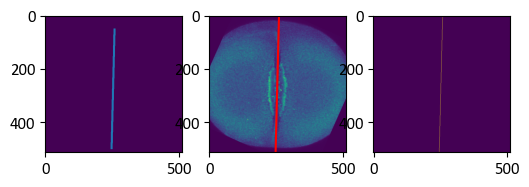

frame 19


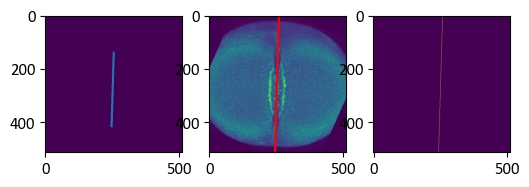

frame 20


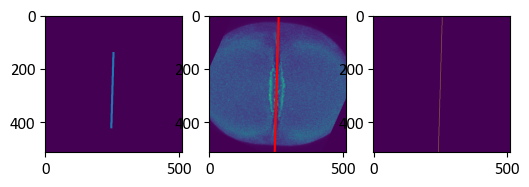

frame 21


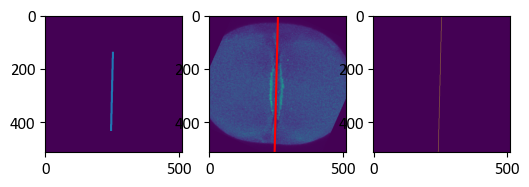

frame 22


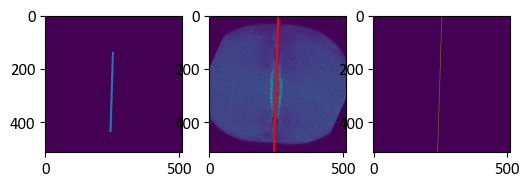

frame 23


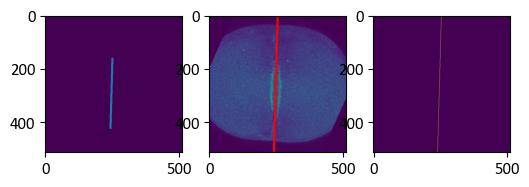

frame 24


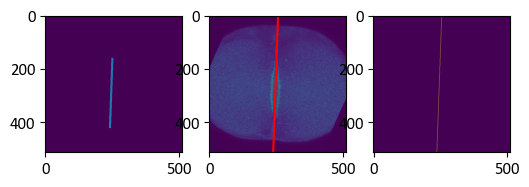

frame 25


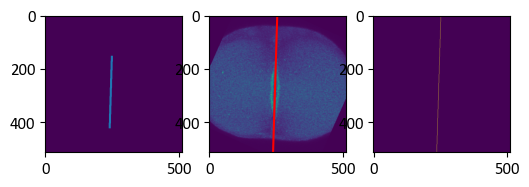

frame 26


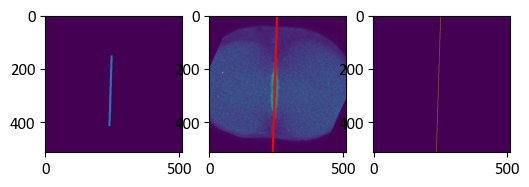

frame 27


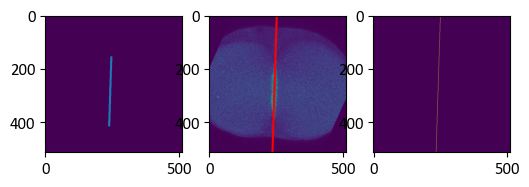

frame 28


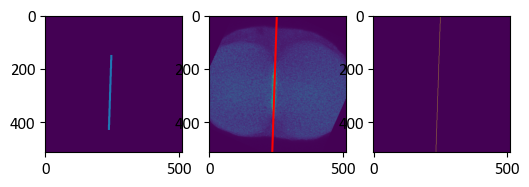

In [12]:
# import the manually outlined furrow # calculate the furrow_para
fu_ = skimage.io.imread('furrowroi_rep3.tif')
fu_pro = np.zeros_like(fu_)
fu_coord = []

for f in range(fs):
# for f in [10]:
    print('frame', f)
    fu = fu_[f]
    
    fig, [ax, ax2, ax1] = plt.subplots(1,3,figsize=[6,2])
    ax.imshow(fu)
    ax2.imshow(data_raw_max[f])

    if np.any(fu != 0):

        y_f = np.where(fu !=0)[0]
        x_f = np.where(fu !=0)[1]
        slope, intercept = np.polyfit(y_f, x_f, 1)

        y_para = np.arange(ys)
        x_para = y_para * slope + intercept

        fu_pro[f, y_para, x_para.astype(int)] = 1
        fu_coord.append([f, np.stack([y_para, x_para]), [slope, intercept]])

        ax.plot(x_f, y_f)
        ax2.plot(x_para, y_para, color='r')
        
    else:
        fu_coord.append([f, np.nan])
    
    ax1.imshow(fu_pro[f])
    plt.show()

frame 0


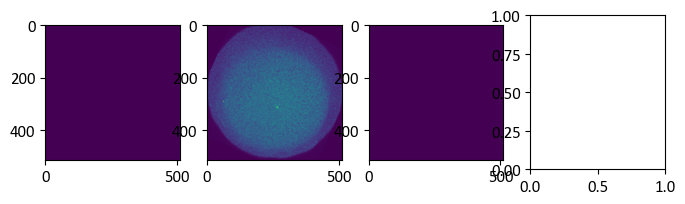

frame 1


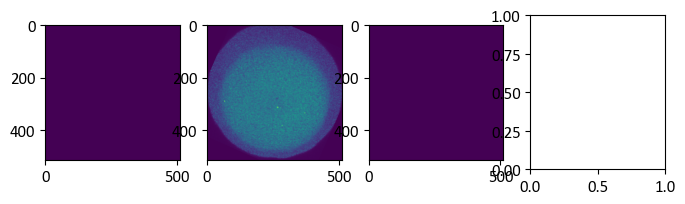

frame 2


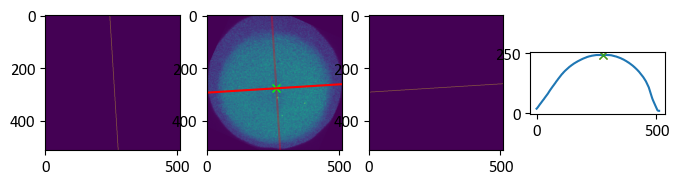

frame 3


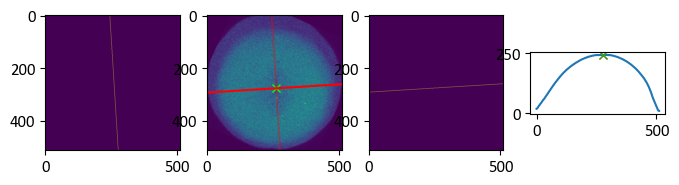

frame 4


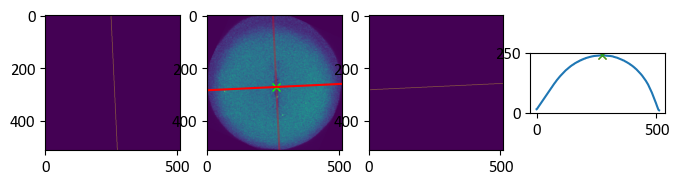

frame 5


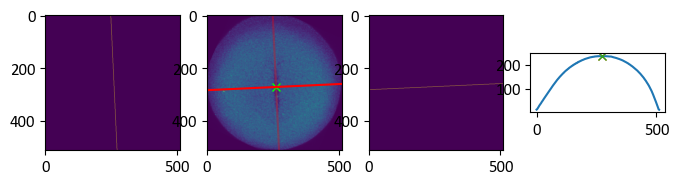

frame 6


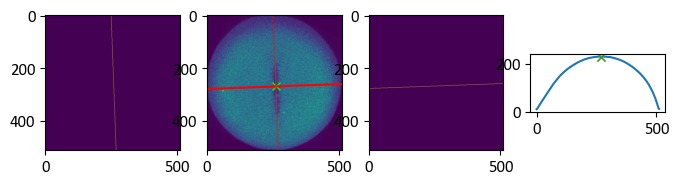

frame 7


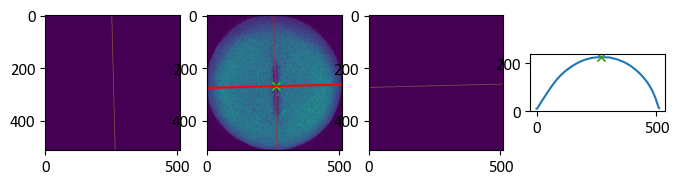

frame 8


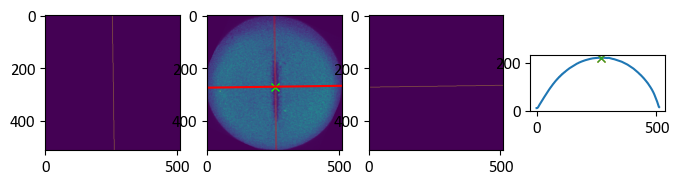

frame 9


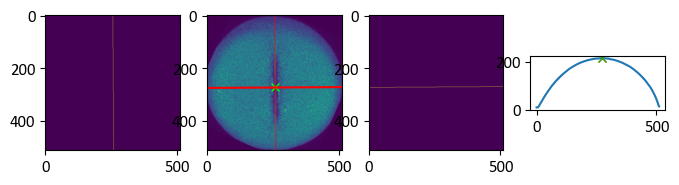

frame 10


C:\Users\xtong\AppData\Local\Temp\ipykernel_10376\928866980.py:22: RuntimeWarning: Mean of empty slice
  image_masked = np.nanmean(image_masked_oneedge, axis=1)


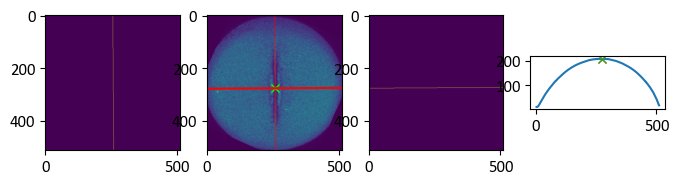

frame 11


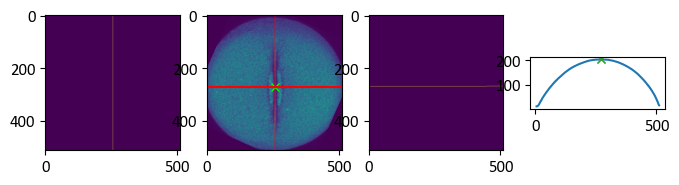

frame 12


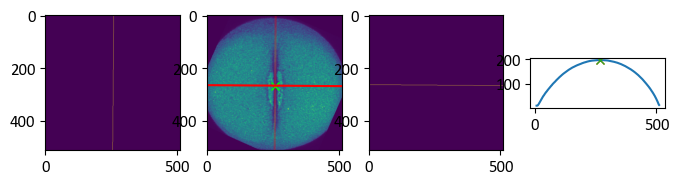

frame 13


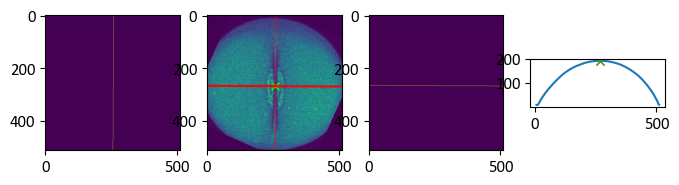

frame 14


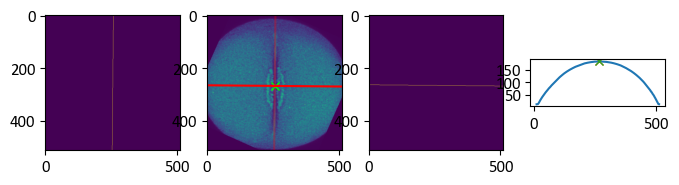

frame 15


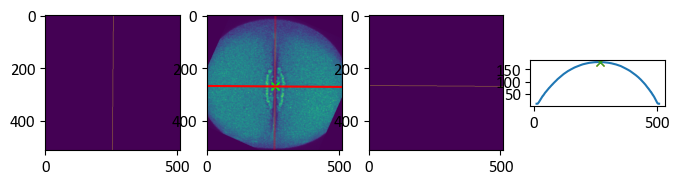

frame 16


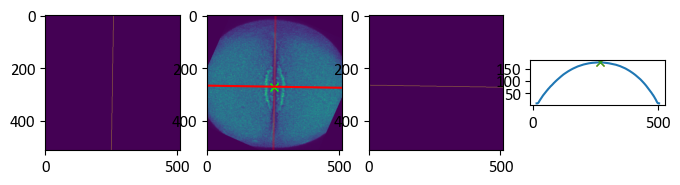

frame 17


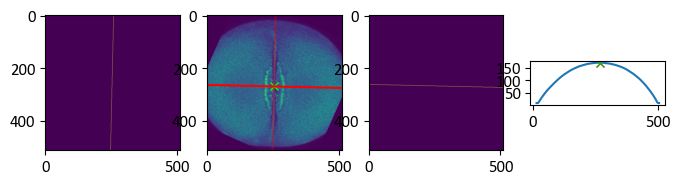

frame 18


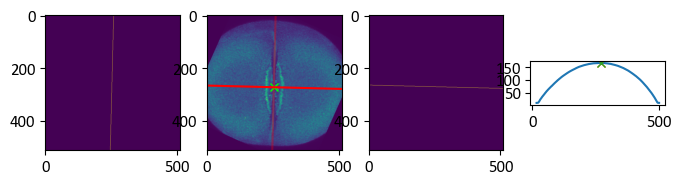

frame 19


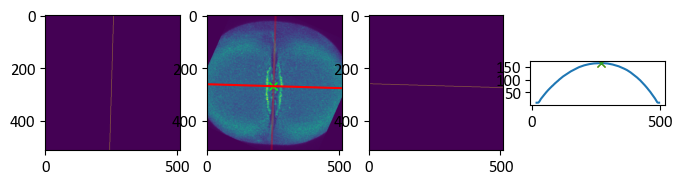

frame 20


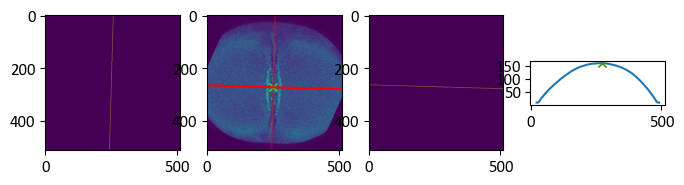

frame 21


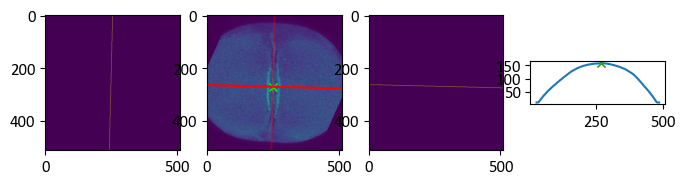

frame 22


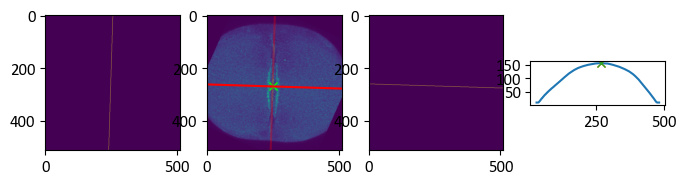

frame 23


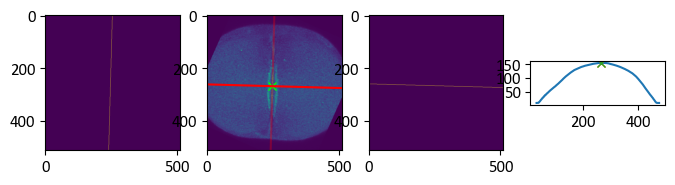

frame 24


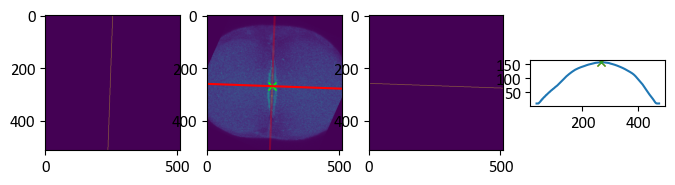

frame 25


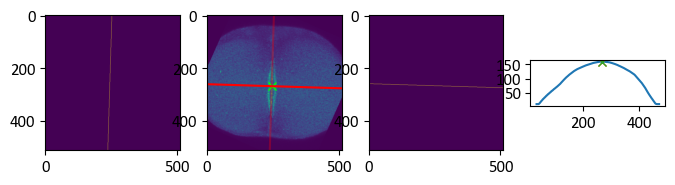

frame 26


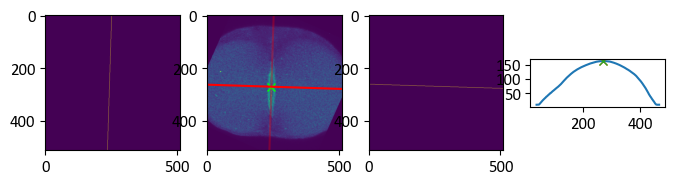

frame 27


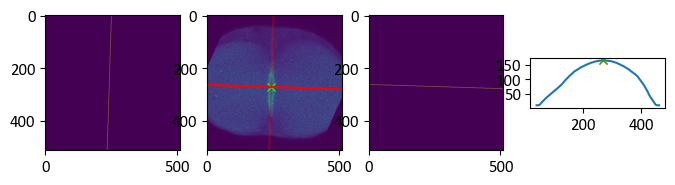

frame 28


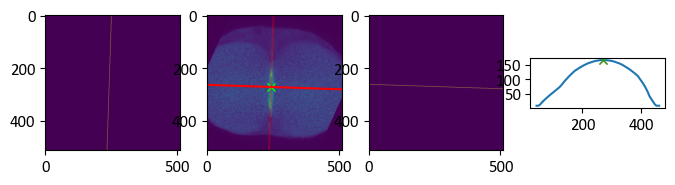

In [13]:
# calculate the furrow_perp # calculate the furrow_center
from scipy.ndimage import gaussian_filter

fu_pro_perp = np.zeros_like(height)
fu_coord_perp = []
fu_pro_center = np.zeros_like(height)
fu_coord_center = []

for f in range(fs):
# for f in [10]:
    print('frame', f)
    
    h = height[f]
    fu = fu_pro[f]

    fig, [ax, ax2, ax1, ax3] = plt.subplots(1,4,figsize=[8,2])
    ax.imshow(fu)
    ax2.imshow(data_raw_max[f])
    
    if np.any(fu !=0):
        
        fu_h_para = mask_kymo(fu, h, axis='y', iterations = 25)
        peaks, _ = scipy.signal.find_peaks(gaussian_filter(fu_h_para, sigma=5), height=50, distance=150)
        peak_y = peaks[0]
        # peak_y = np.nanargmax(fu_h_para)
        peak_x = fu_coord[f][1][1][peak_y]
        ax3.plot(fu_h_para)
        ax3.plot(peak_y, fu_h_para[peak_y], 'x')
        ax3.plot(peaks, fu_h_para[peaks], 'x')
        ax3.set_aspect('equal')

        ax2.plot(peak_x, peak_y, 'x', color='lime')
        slope = -fu_coord[f][2][0]

        y_para, x_para = fu_coord[f][1]
        ax2.plot(x_para, y_para, color='red', alpha=0.3)

        x_perp = np.arange(xs)
        y_perp = (x_perp - peak_x) * slope + peak_y

        fu_pro_perp[f, y_perp.astype(int), x_perp] = 1
        fu_coord_perp.append([f, np.stack([y_perp, x_perp]), [slope, intercept]])
        fu_coord_center.append([f, peak_y, peak_x])

        ax2.plot(x_perp, y_perp, color='red')
    else:
        fu_coord_perp.append([f, np.nan,np.nan])
        fu_coord_center.append([f, np.nan,np.nan])

    ax1.imshow(fu_pro_perp[f])
    plt.show()
    
fu_coord_center = np.array(fu_coord_center)
for f, y,x in zip(fu_coord_center[:, 0], fu_coord_center[:, 1], fu_coord_center[:, 2]):
    # print(f,y,x)
    if not np.isnan(y):
        fu_pro_center[int(f),int(y),int(x)] = 1 

In [14]:
def colored_line(x,y,c,ax, vmin=0, vmax=1, **lc_kwargs):
    
    from matplotlib.collections import LineCollection
    default_kwargs = {"capstyle": "butt"}
    default_kwargs.update(lc_kwargs)

    # c = (c-np.nanmin(c)) / (np.nanmax(c) - np.nanmin(c))
    # c = (c-vmin) / (vmax-vmin)
    # colors = plt.colormaps[cmap](c)

    x = np.asarray(x)
    y = np.asarray(y)
    x_midpts = np.hstack((x[0], 0.5 * (x[1:] + x[:-1]), x[-1]))
    y_midpts = np.hstack((y[0], 0.5 * (y[1:] + y[:-1]), y[-1]))

    coord_start = np.column_stack((x_midpts[:-1], y_midpts[:-1]))[:, np.newaxis, :]
    coord_mid = np.column_stack((x, y))[:, np.newaxis, :]
    coord_end = np.column_stack((x_midpts[1:], y_midpts[1:]))[:, np.newaxis, :]
    segments = np.concatenate((coord_start, coord_mid, coord_end), axis=1)

    lc = LineCollection(segments, **default_kwargs)
    if (vmin==0) and (vmax ==1):
        lc.set_array(c)
    else:
        lc.set_array(c)
        lc.set(clim=(vmin, vmax))

    return ax.add_collection(lc)


def colored_string(string, cmap):
    num = len(string)
    word_colors = plt.colormaps[cmap](np.arange(num)/(num-1))
    return_string = ''
    for i in range(num):
        return_string = return_string + r'\textcolor{'+ mpl.colors.to_hex(word_colors[i]) + r'}{' + string[i] + '}'
        # print(return_string)
    return return_string

<>:121: SyntaxWarning: invalid escape sequence '\m'
<>:122: SyntaxWarning: invalid escape sequence '\m'
<>:121: SyntaxWarning: invalid escape sequence '\m'
<>:122: SyntaxWarning: invalid escape sequence '\m'
C:\Users\xtong\AppData\Local\Temp\ipykernel_19988\1596423942.py:121: SyntaxWarning: invalid escape sequence '\m'
  axs[0,2].set_title('k1 curvature ($\mathregular{\u03BCm^{-1}}$)\n', color='black', fontsize=12)
C:\Users\xtong\AppData\Local\Temp\ipykernel_19988\1596423942.py:122: SyntaxWarning: invalid escape sequence '\m'
  axs[0,3].set_title('k2 curvature ($\mathregular{\u03BCm^{-1}}$)\n', color='grey', fontsize=12)


0.14
frame 0


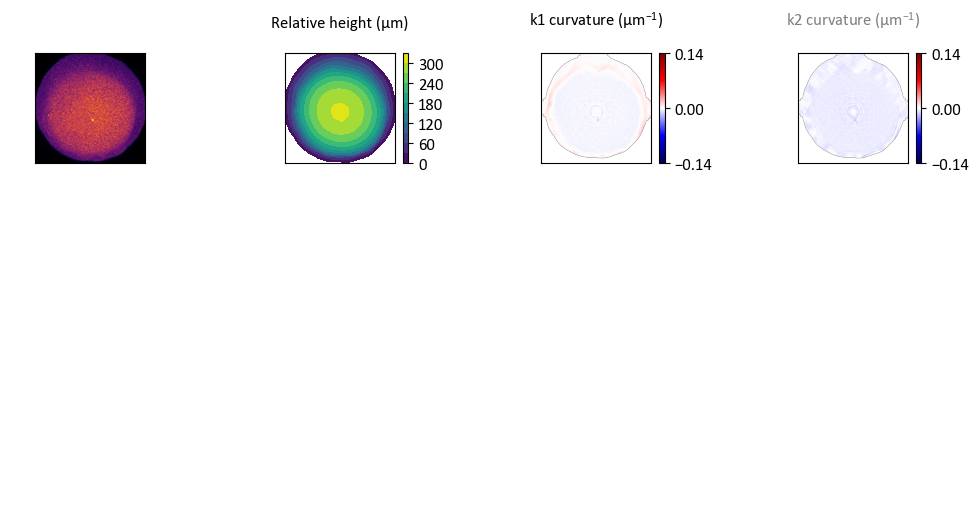

frame 1


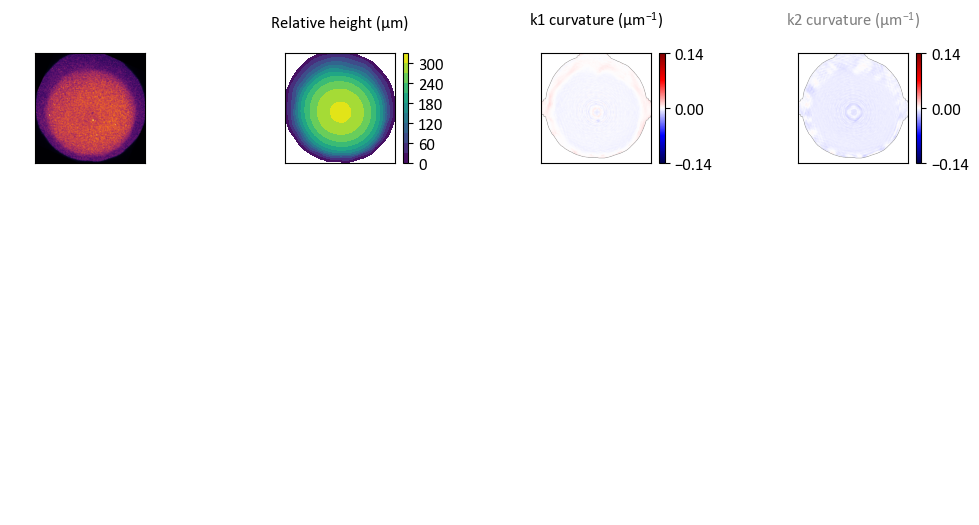

frame 2


C:\Users\xtong\AppData\Local\Temp\ipykernel_19988\928866980.py:22: RuntimeWarning: Mean of empty slice
  image_masked = np.nanmean(image_masked_oneedge, axis=1)


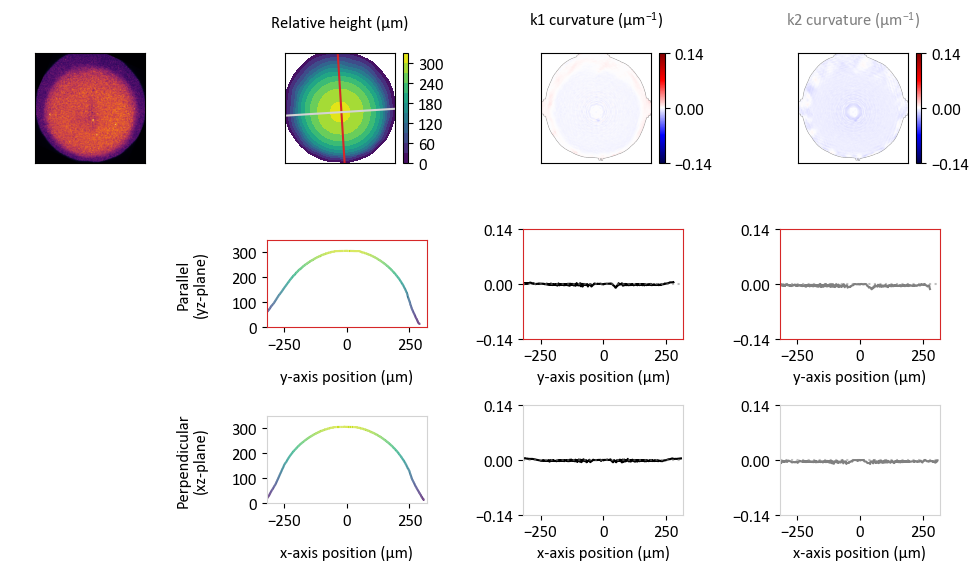

frame 3


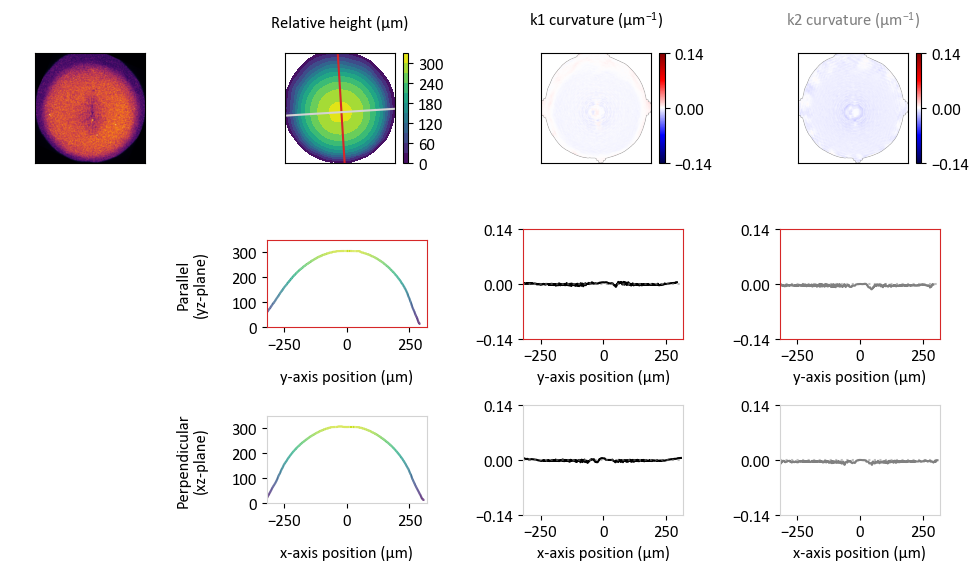

frame 4


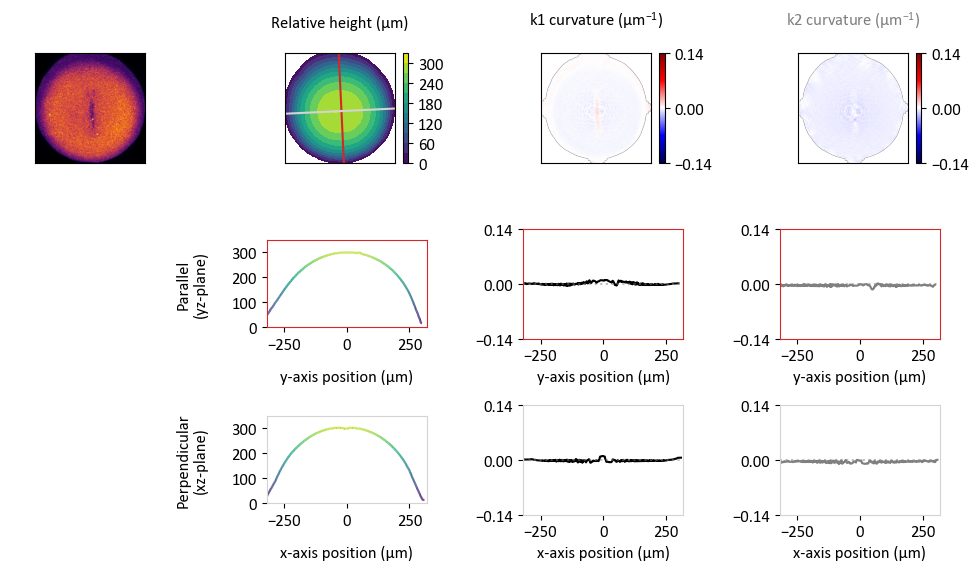

frame 5


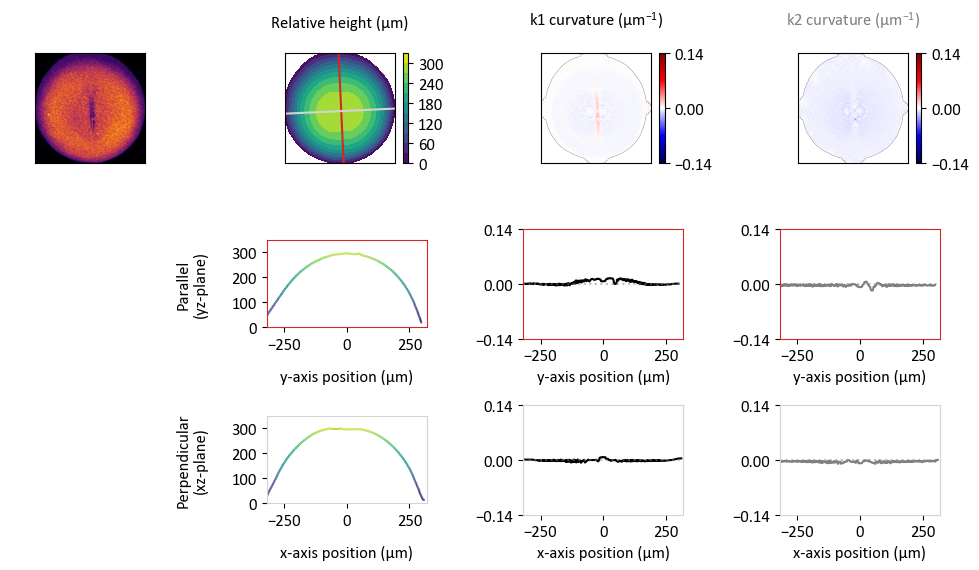

frame 6


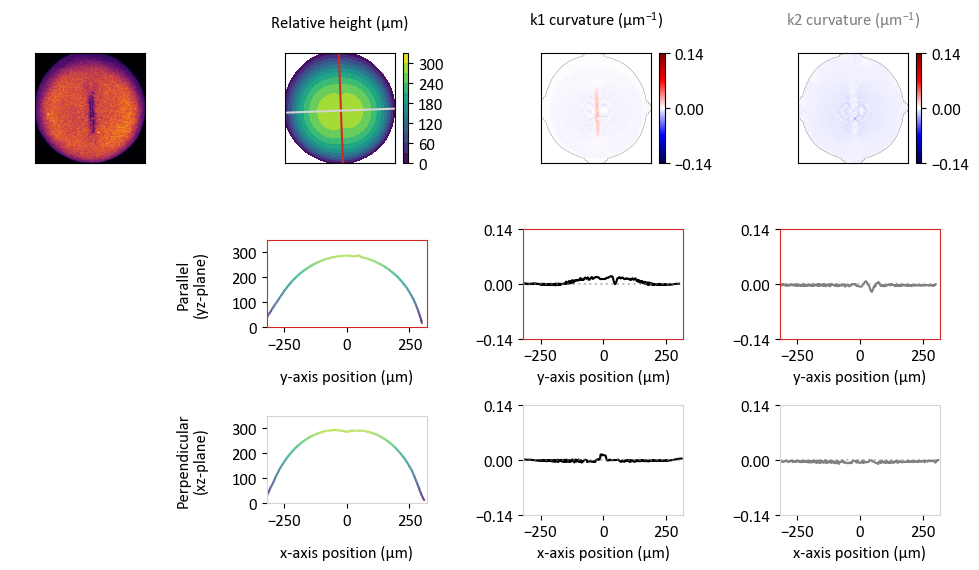

frame 7


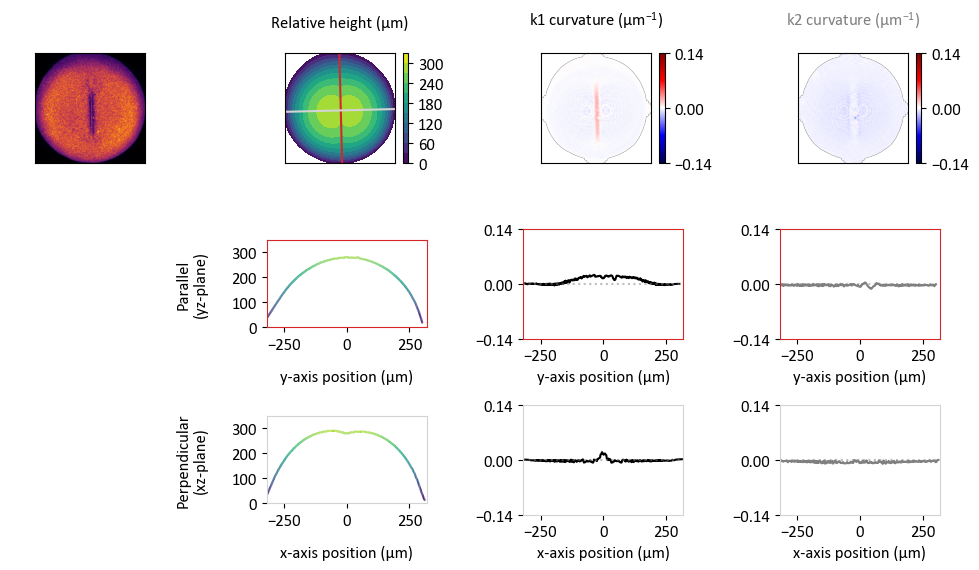

frame 8


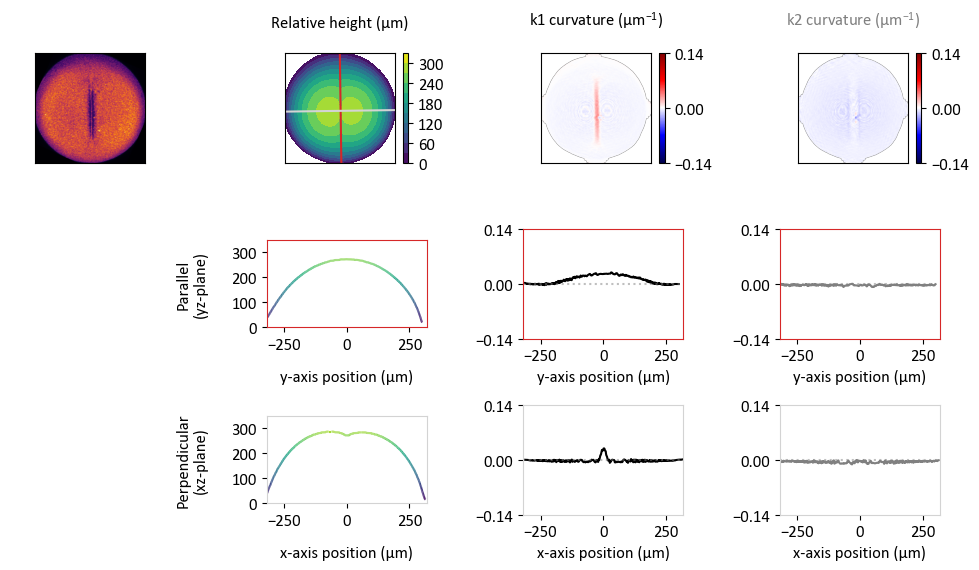

frame 9


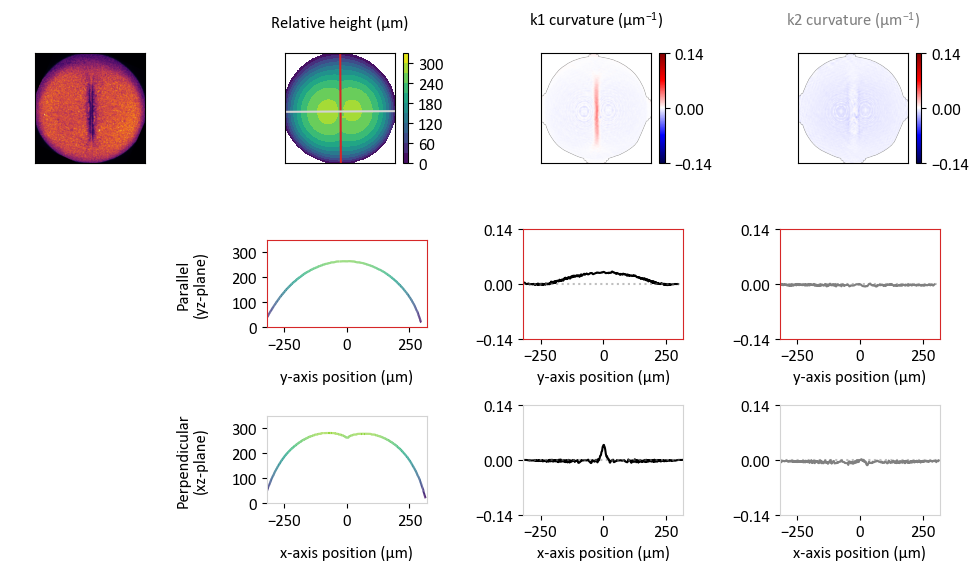

frame 10


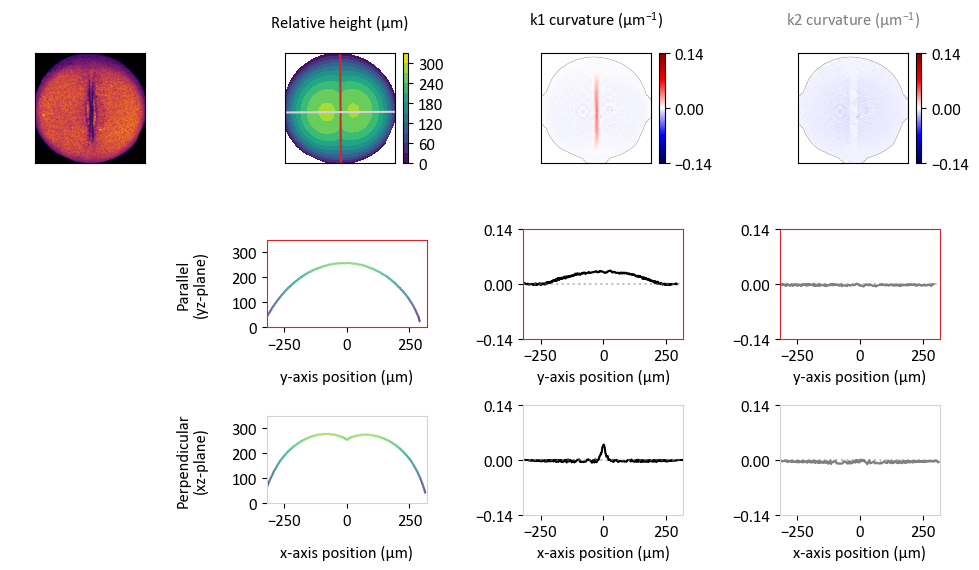

frame 11


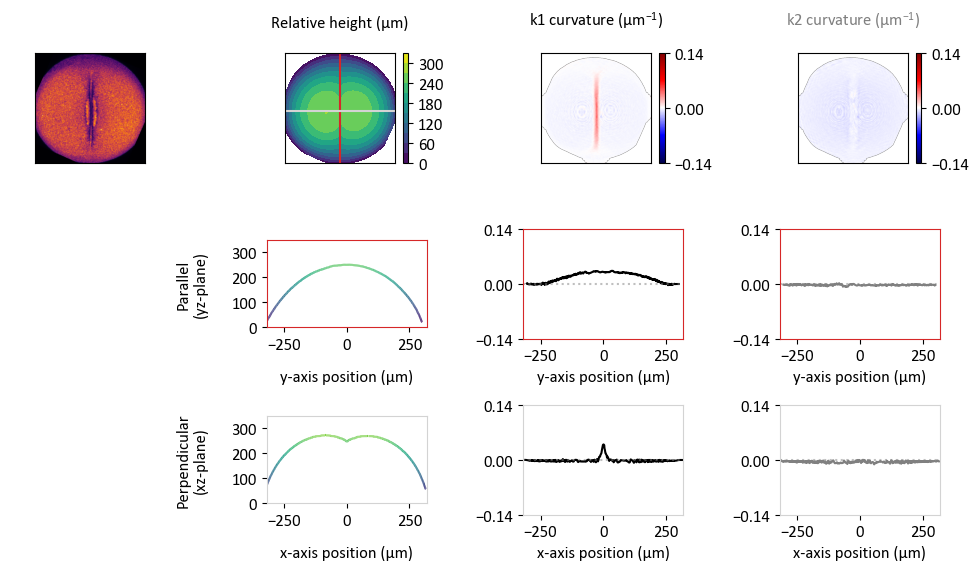

frame 12


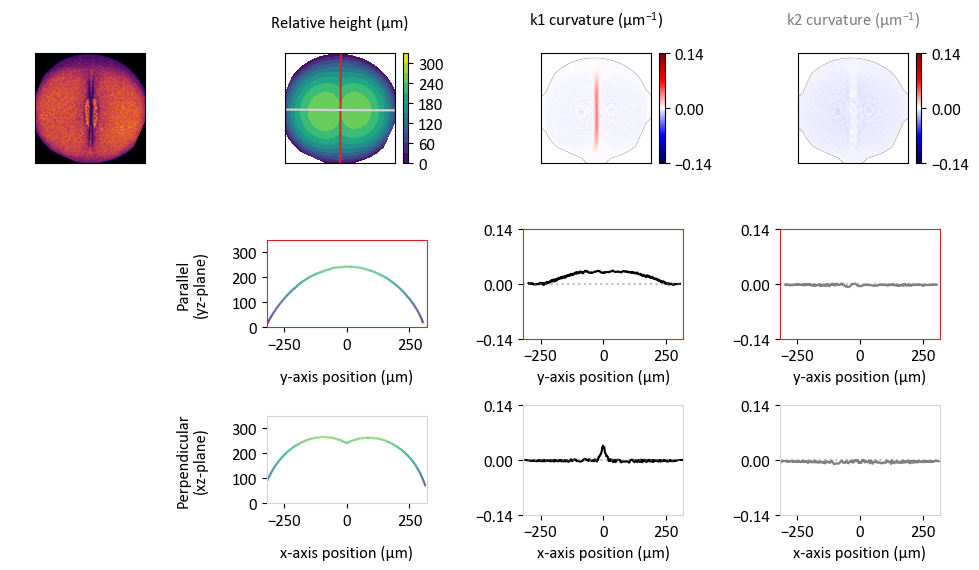

frame 13


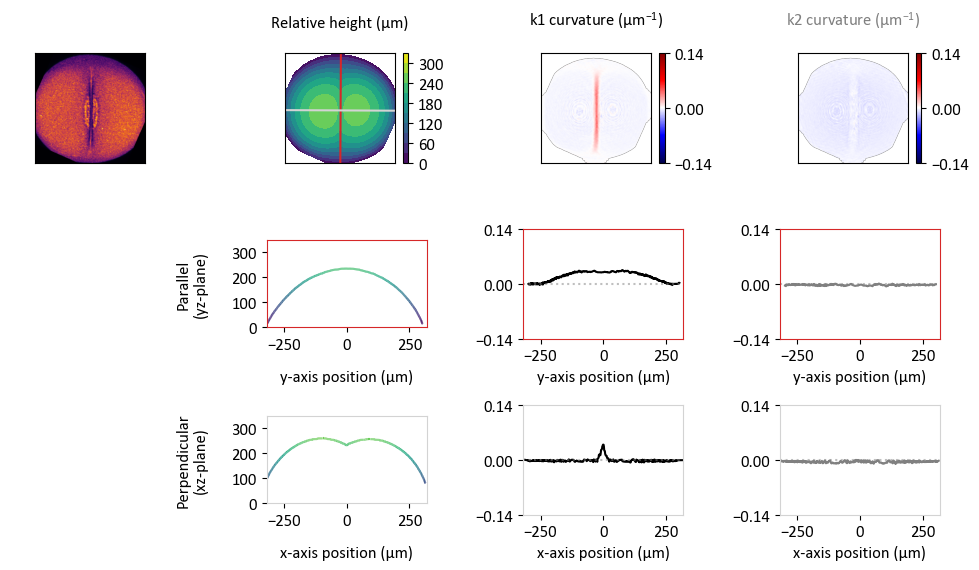

frame 14


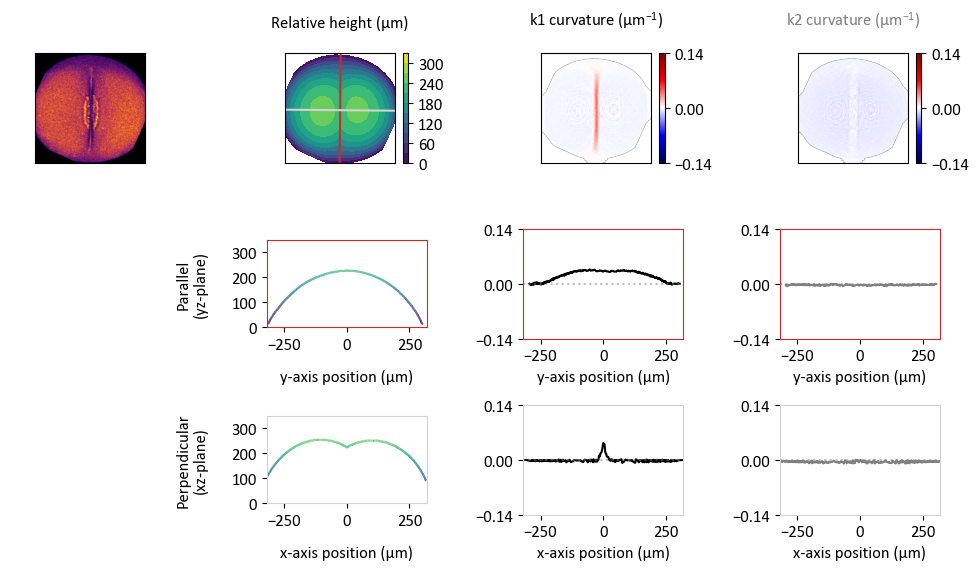

frame 15


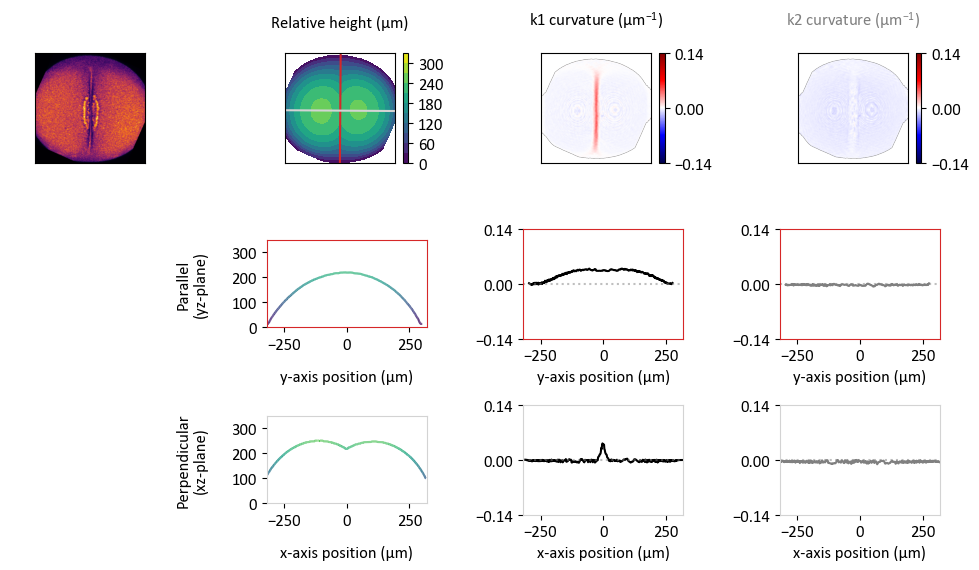

frame 16


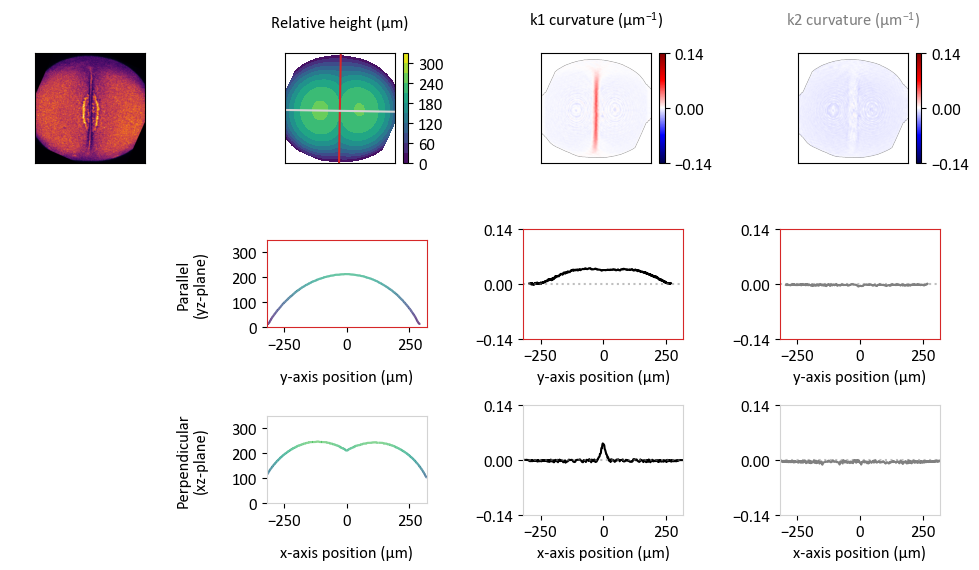

frame 17


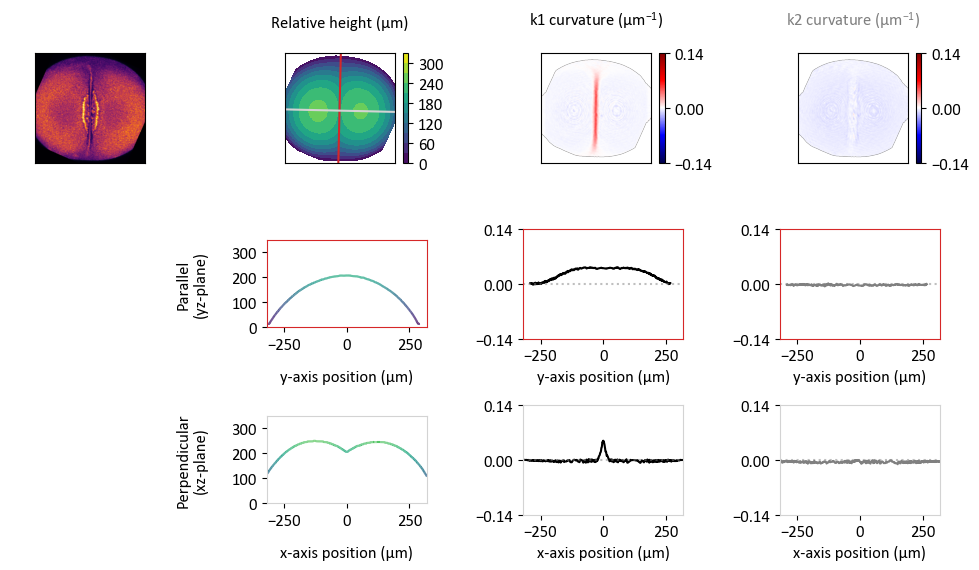

frame 18


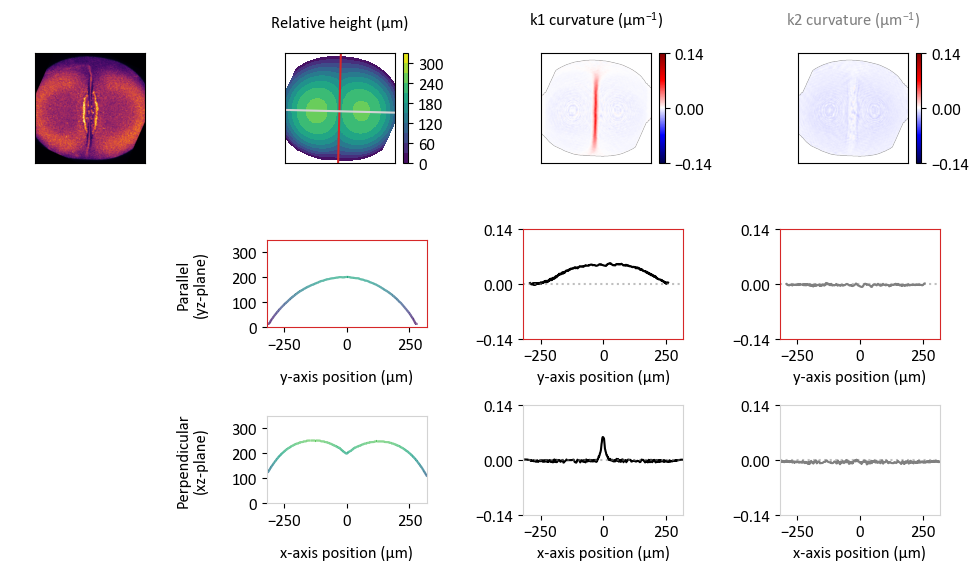

frame 19


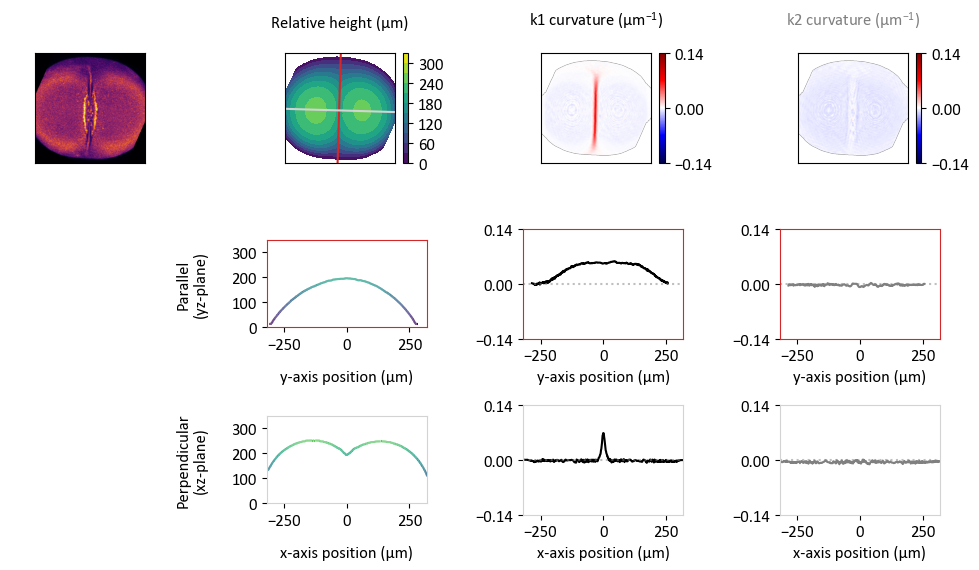

frame 20


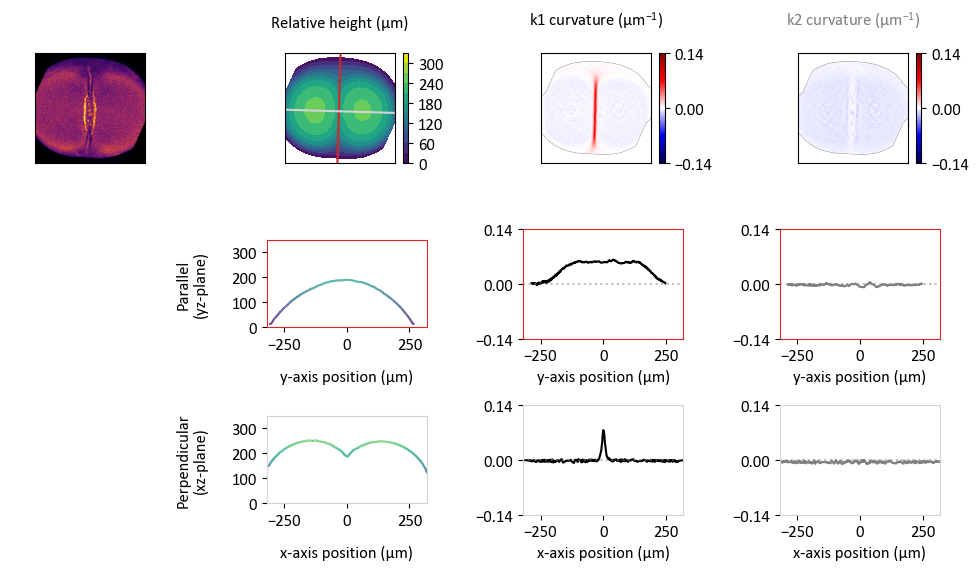

frame 21


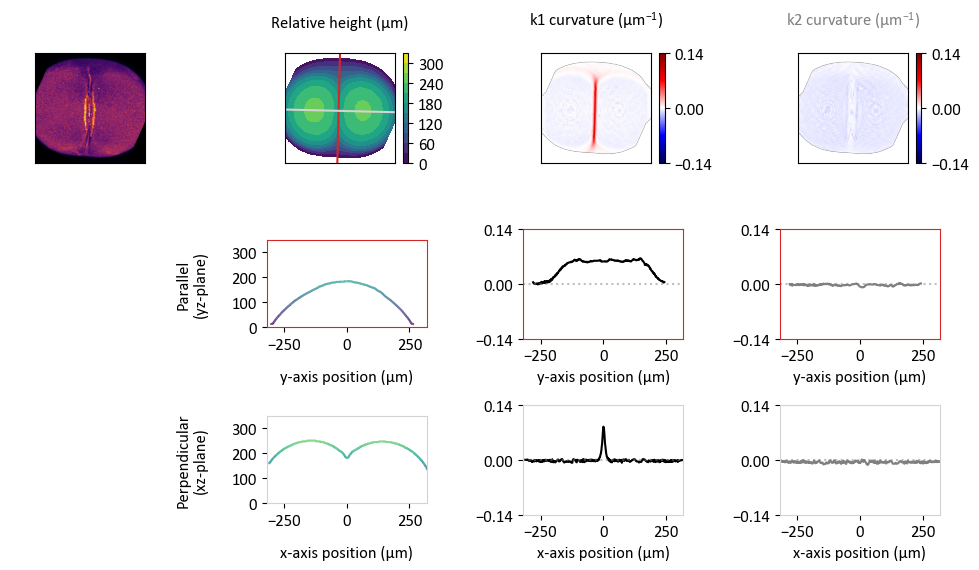

frame 22


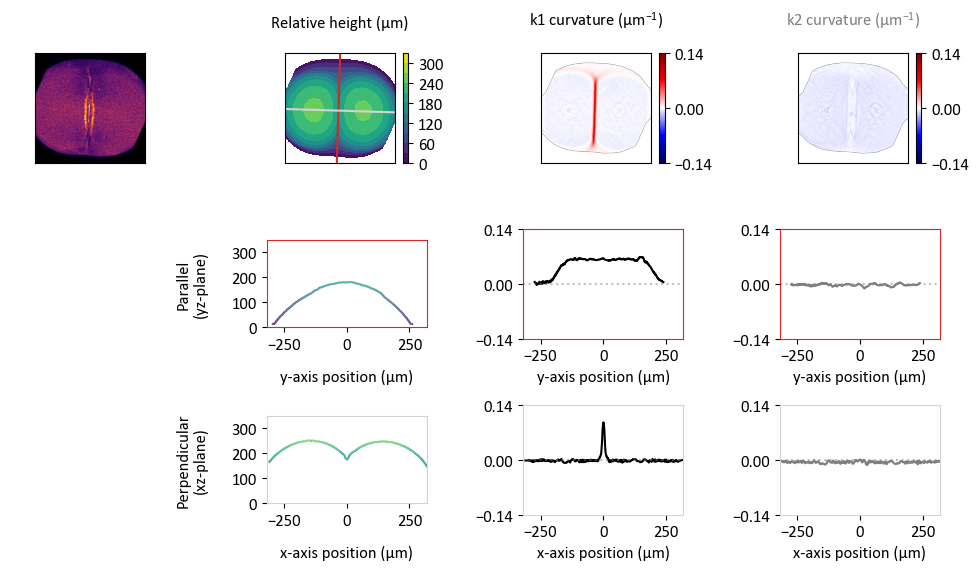

frame 23


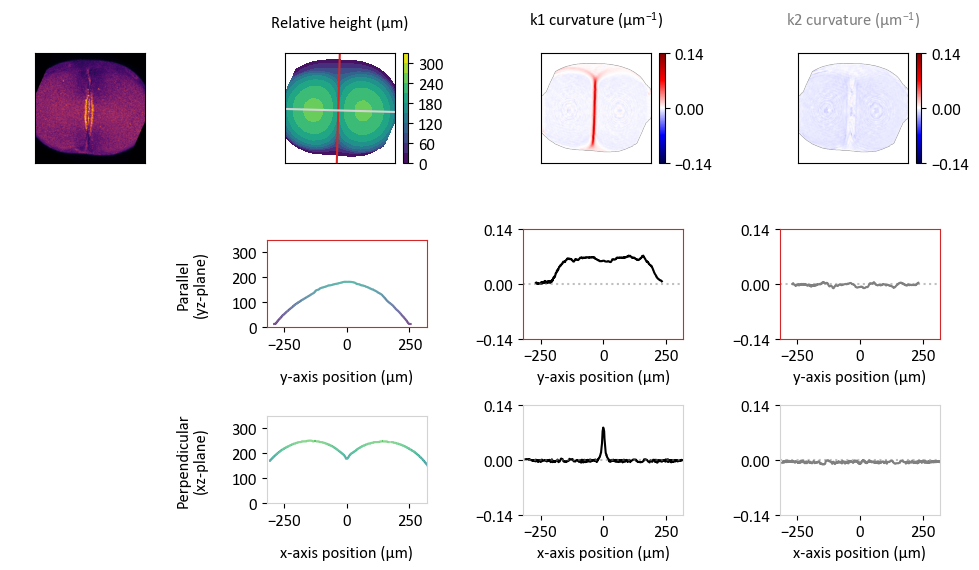

frame 24


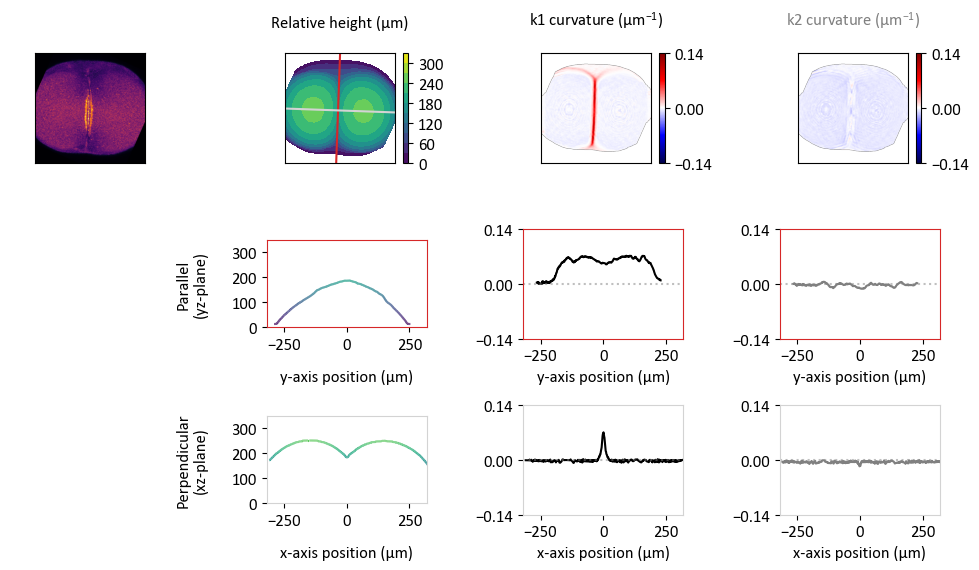

frame 25


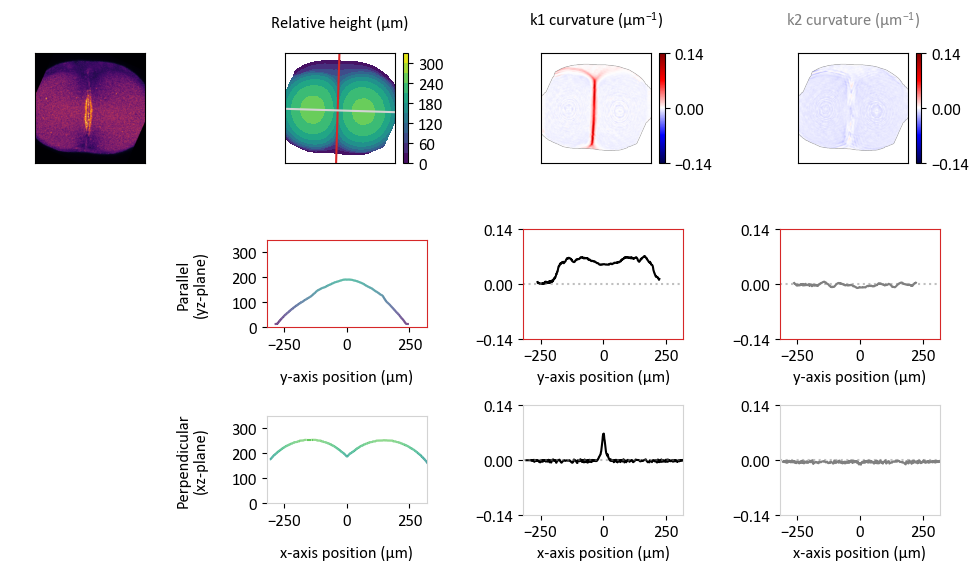

frame 26


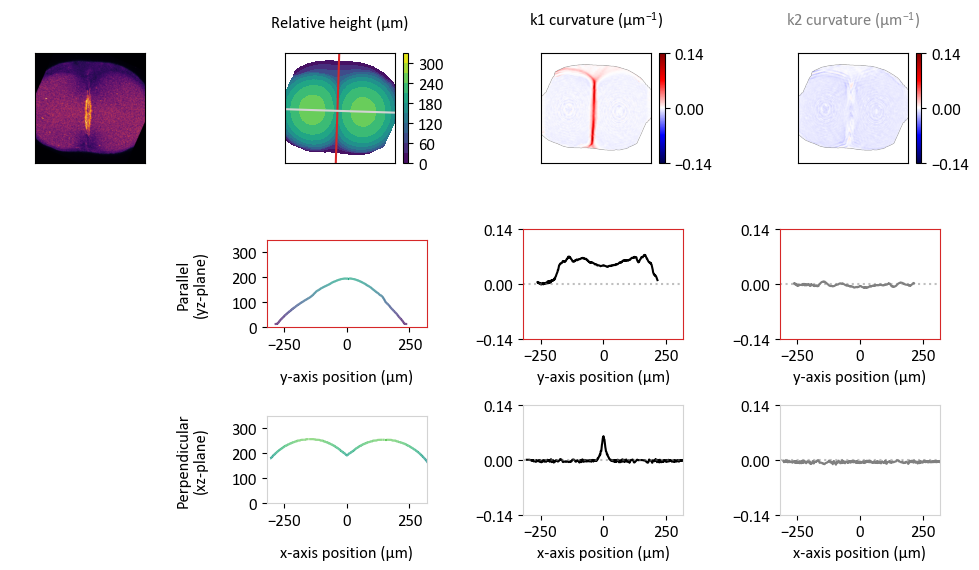

frame 27


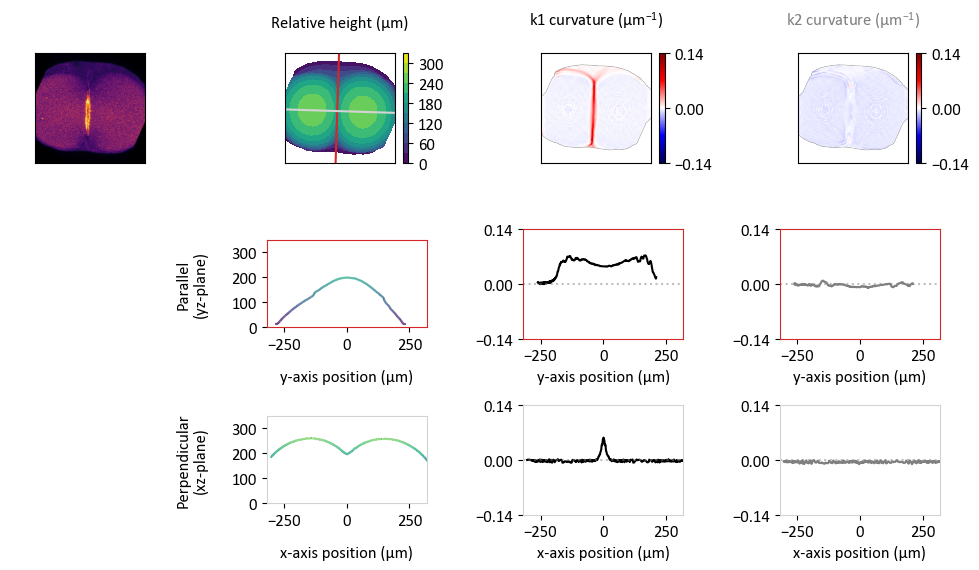

frame 28


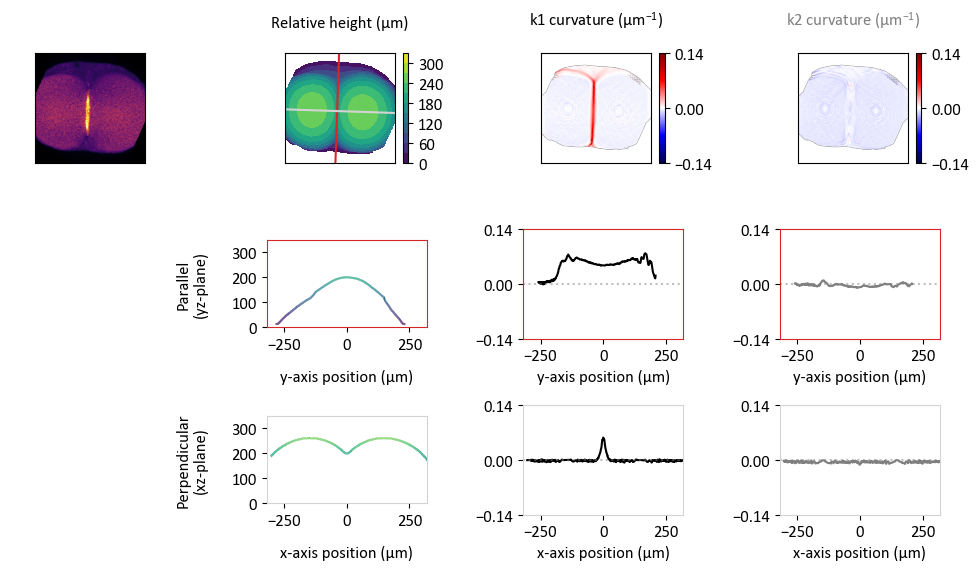

In [23]:
export_folder_name = 'furrow_analysis_export'
create_folder(export_folder_name)

k_range = 0.14
print(k_range)

fu_set = {'fu_h_para': [],
          'fu_h_perp': [],
          'fu_k1_para': [],
          'fu_k1_perp': [],
          'fu_k2_para': [],
          'fu_k2_perp': []}

for f in range(fs):
# for f in [10]:
    print('frame', f)

    h = height[f]
    fu = fu_pro[f]
    fu_perp = fu_pro_perp[f]
    center_y = fu_coord_center[:, 1][fu_coord_center[:, 0] == f][0]
    center_x = fu_coord_center[:, 2][fu_coord_center[:, 0] == f][0]
    fu_perp_xs = np.arange(xs) - center_x
    fu_para_ys = np.arange(ys) - center_y
    
    fig, axs = plt.subplots(3,4,figsize=[12,6])
    axs[0,0].imshow(data_raw_max[f], cmap='inferno', vmin=0, vmax=16000)
    # axs[0,1].imshow(h*pixel_size, vmin=levels[0],vmax=levels[-1])
    cs = axs[0,1].contourf(h*pixel_size, levels = levels, cmap='viridis')
    axs[0,1].set_aspect('equal')
    axs[0,1].invert_yaxis()
    k1_plot = axs[0,2].imshow(k1[f]/pixel_size, cmap='seismic', vmin=-k_range, vmax=k_range)
    k2_plot = axs[0,3].imshow(k2[f]/pixel_size, cmap='seismic', vmin=-k_range, vmax=k_range)

    cbar1 = fig.colorbar(cs)
    cbar2 = fig.colorbar(k1_plot, ticks=[-0.14, 0, 0.14])
    cbar3 = fig.colorbar(k2_plot, ticks=[-0.14, 0, 0.14])

    for spine in axs[1,1].spines.values():
        spine.set_edgecolor('tab:red')
    for spine in axs[1,2].spines.values():
        spine.set_edgecolor('tab:red')
    for spine in axs[1,3].spines.values():
        spine.set_edgecolor('tab:red')
    for spine in axs[2,1].spines.values():
        spine.set_edgecolor("lightgrey")
    for spine in axs[2,2].spines.values():
        spine.set_edgecolor("lightgrey")
    for spine in axs[2,3].spines.values():
        spine.set_edgecolor("lightgrey")

    # axs[2,0].imshow(data2_raw[f], cmap='inferno', vmin=0, vmax=12000)
    
    [axs[0,i].set_xticks([]) for i in range(4)]
    [axs[0,i].set_yticks([]) for i in range(4)]
    axs[1,0].set_axis_off()
    axs[2,0].set_axis_off()

    if np.any(fu !=0):

        ite_num = 6
        
        axs[0,1].plot(fu_coord[f][1][1], fu_coord[f][1][0], color='tab:red', alpha=1)
        axs[0,1].plot(fu_coord_perp[f][1][1], fu_coord_perp[f][1][0], color='lightgrey', alpha=1)

        ### height para perp
        fu_h_para = mask_kymo(fu, h, axis='y', iterations = ite_num)
        # axs[1,1].plot(fu_para_ys*pixel_size, fu_h_para*pixel_size, color='black')
        colored_line(x=fu_para_ys*pixel_size, y=fu_h_para*pixel_size, c=fu_h_para*pixel_size, ax=axs[1,1], cmap='viridis', vmin=levels[0], vmax=levels[-1])
        fu_h_perp = mask_kymo(fu_perp, h, axis='x', iterations = ite_num)
        # axs[2,1].plot(fu_perp_xs*pixel_size, fu_h_perp*pixel_size, color='black')
        colored_line(x=fu_perp_xs*pixel_size, y=fu_h_perp*pixel_size, c=fu_h_perp*pixel_size, ax=axs[2,1], cmap='viridis', vmin=levels[0], vmax=levels[-1])

        ### k1 para perp
        fu_k1_para = mask_kymo(fu, k1[f], axis='y', iterations = ite_num)
        axs[1,2].plot(fu_para_ys*pixel_size, fu_k1_para/pixel_size, color='black')
        fu_k1_perp = mask_kymo(fu_perp, k1[f], axis='x', iterations = ite_num)
        axs[2,2].plot(fu_perp_xs*pixel_size, fu_k1_perp/pixel_size, color='black')

        ### k2 para perp
        fu_k2_para = mask_kymo(fu, k2[f], axis='y', iterations = ite_num)
        axs[1,3].plot(fu_para_ys*pixel_size, fu_k2_para/pixel_size, color='grey')
        fu_k2_perp = mask_kymo(fu_perp, k2[f], axis='x', iterations = ite_num)
        axs[2,3].plot(fu_perp_xs*pixel_size, fu_k2_perp/pixel_size, color='grey')

        ### horizontal 0 line
        for i in [1,2]:
            for j in [2,3]:
                axs[i,j].axhline(y=0, color='grey', ls=':', alpha=0.5)

        fu_set['fu_h_para'].append(fu_h_para)
        fu_set['fu_h_perp'].append(fu_h_perp)
        fu_set['fu_k1_para'].append(fu_k1_para)
        fu_set['fu_k1_perp'].append(fu_k1_perp)
        fu_set['fu_k2_para'].append(fu_k2_para)
        fu_set['fu_k2_perp'].append(fu_k2_perp)

        axs[1,1].set_ylim(0, hs*pixel_size*1.1)
        axs[2,1].set_ylim(0, hs*pixel_size*1.1)
        [axs[1,i].set_xlim(-ys*pixel_size/2, ys*pixel_size/2) for i in range(1,4)]
        [axs[2,i].set_xlim(-xs*pixel_size/2, xs*pixel_size/2) for i in range(1,4)]
        axs[1,2].set_ylim(-k_range, k_range)
        axs[2,2].set_ylim(-k_range, k_range)
        axs[1,3].set_ylim(-k_range, k_range)
        axs[2,3].set_ylim(-k_range, k_range)
        axs[2,1].set_aspect('equal')
        axs[1,1].set_aspect('equal')

    else:
        fu_set['fu_h_para'].append(np.full(fu_para_ys.shape, np.nan))
        fu_set['fu_h_perp'].append(np.full(fu_perp_xs.shape, np.nan))
        fu_set['fu_k1_para'].append(np.full(fu_para_ys.shape, np.nan))
        fu_set['fu_k1_perp'].append(np.full(fu_perp_xs.shape, np.nan))
        fu_set['fu_k2_para'].append(np.full(fu_para_ys.shape, np.nan))
        fu_set['fu_k2_perp'].append(np.full(fu_perp_xs.shape, np.nan))
        for i in [1,2]:
            for j in [1,2,3]:
                axs[i,j].set_axis_off()

    axs[0,1].set_title('Relative height (\u03BCm)\n', fontsize=12)
    axs[0,2].set_title('k1 curvature ($\mathregular{\u03BCm^{-1}}$)\n', color='black', fontsize=12)
    axs[0,3].set_title('k2 curvature ($\mathregular{\u03BCm^{-1}}$)\n', color='grey', fontsize=12)
    # axs[0,1].set_ylabel('Top view')
    axs[1,1].set_ylabel('Parallel\n(yz-plane)\n')
    axs[2,1].set_ylabel('Perpendicular\n(xz-plane)\n')

    [axs[i,1].set_yticks([0,100,200,300]) for i in [1,2]]
    [axs[i,2].set_yticks([-0.14, 0, 0.14]) for i in [1,2]]
    [axs[i,3].set_yticks([-0.14, 0, 0.14]) for i in [1,2]]

    [axs[1,i].set_xlabel('y-axis position (\u03BCm)') for i in range(1,4)]
    [axs[2,i].set_xlabel('x-axis position (\u03BCm)') for i in range(1,4)]
    

    fig.align_labels()
    fig.align_titles()
    plt.subplots_adjust(wspace=0.6, hspace=0.6)
    plt.savefig(export_folder_name + '/' + str(f+1) + '.png', dpi=400)
    plt.show()

In [ ]:
# fu_pro, fu_coord
# fu_pro_perp, fu_coord_perp
# fu_pro_center, fu_coord_center

fu_h_para = fu_set['fu_h_para']
fu_k1_para = fu_set['fu_k1_para']
fu_h_perp = fu_set['fu_h_perp']
fu_k1_perp = fu_set['fu_k1_perp']
fu_k2_para = fu_set['fu_k2_para']
fu_k2_perp = fu_set['fu_k2_perp']

fu_h_para_nparray = np.array(fu_h_para)
fu_k1_para_nparray = np.array(fu_k1_para)
fu_k2_para_nparray = np.array(fu_k2_para)
fu_h_perp_nparray = np.array(fu_h_perp)
fu_k1_perp_nparray = np.array(fu_k1_perp)
fu_k2_perp_nparray = np.array(fu_k2_perp)

fu_info_to_export = [fu_h_para_nparray,
          fu_k1_para_nparray,
          fu_k2_para_nparray,
          fu_h_perp_nparray,
          fu_k1_perp_nparray,
          fu_k2_perp_nparray]

for i, fu_info_to_export_ in enumerate(fu_info_to_export):
    np.save('fu_info_to_export' +str(i) + '.npy', fu_info_to_export_)

In [15]:
fu_h_para_nparray, fu_k1_para_nparray, fu_k2_para_nparray, fu_h_perp_nparray, fu_k1_perp_nparray, fu_k2_perp_nparray = [np.load('fu_info_to_export' + str(i) + '.npy') for i in range(6)]
fu_range = np.load('fu_range.npy')
k1, k2 = skimage.io.imread('k1.tif'), skimage.io.imread('k2.tif')
# fu_pro, fu_coord
# fu_pro_perp, fu_coord_perp
# fu_pro_center, fu_coord_center

In [16]:
##  Get the edges of the furrow

0.0029827541898223074


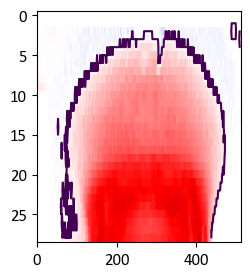

In [16]:
from skimage.transform import rescale
a = rescale(fu_k1_para_nparray, [10, 1])
b = gaussian_filter(a, sigma=0, axes=1)
c = gaussian_filter(a, sigma=2, axes=None)
fu_thresh = np.nanpercentile(c[c>0], 10)
print(fu_thresh/pixel_size)
fu_k1_para_nparray_mask = b>fu_thresh
fu_k1_para_nparray_mask = rescale(fu_k1_para_nparray_mask, [0.1,1])

fig, ax = plt.subplots(figsize=[3,3])
ax.imshow(fu_k1_para_nparray, vmin=-0.15, vmax=0.15, aspect=20, cmap='seismic', interpolation='none')
ax.contour(fu_k1_para_nparray_mask, [0])
# ax.axhline(y=f_m2-2)
# ax.axhline(y=f_septum1-2)
plt.show()

In [19]:
from skimage.measure import label, regionprops
fu_k1_para_nparray_label = label(fu_k1_para_nparray_mask)
biggest = np.argmax([object.area for object in regionprops(fu_k1_para_nparray_label)]) +1
real_fu = fu_k1_para_nparray_label == biggest

In [20]:
fu_range = []
for i in range(fs):
    if np.any(real_fu[i]):
        fu_ = np.where(real_fu[i])[0]
        fu_ = [min(fu_), max(fu_)]
    else:
        fu_ =[np.nan, np.nan]
    # print(fu_)
    fu_range.append(fu_)
fu_range = np.array(fu_range)
np.save('fu_range.npy', fu_range)

print(fu_range)

[[ nan  nan]
 [ nan  nan]
 [ nan  nan]
 [239. 356.]
 [208. 379.]
 [177. 393.]
 [151. 416.]
 [136. 422.]
 [120. 432.]
 [106. 441.]
 [ 96. 451.]
 [ 96. 457.]
 [ 86. 462.]
 [ 81. 468.]
 [ 79. 468.]
 [ 78. 469.]
 [ 75. 471.]
 [ 76. 471.]
 [ 76. 470.]
 [ 76. 469.]
 [ 75. 464.]
 [ 75. 460.]
 [ 75. 454.]
 [ 74. 450.]
 [ 73. 446.]
 [ 81. 442.]
 [ 92. 439.]
 [ 86. 437.]
 [ 86. 437.]]


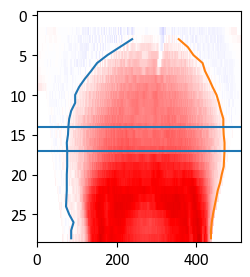

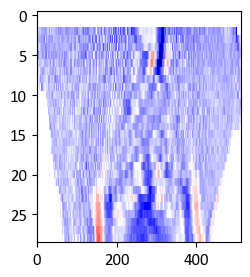

In [21]:

fig, ax = plt.subplots(figsize=[3,3])
ax.imshow(fu_k1_para_nparray, vmin=-0.15, vmax=0.15, aspect=20, cmap='seismic', interpolation='none')
# ax.contour(fu_k1_para_nparray_mask, [0])
ax.plot(fu_range, np.arange(fs))
ax.axhline(y=f_m2-2)
ax.axhline(y=f_septum1-2)
plt.show()

fig, ax = plt.subplots(figsize=[3,3])
ax.imshow(fu_k2_para_nparray, vmin=-0.03, vmax=0.03, aspect=20, cmap='seismic', interpolation='none')
# ax.contour(fu_k1_para_nparray_mask, [0])
# ax.plot(fu_range, np.arange(fs))
# ax.axhline(y=f_m2-2)
# ax.axhline(y=f_septum1-2)
plt.show()

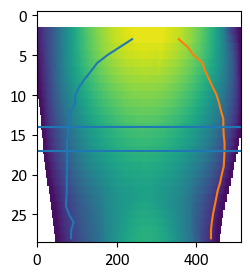

In [22]:
fig, ax = plt.subplots(figsize=[3,3])
ax.imshow(fu_h_para_nparray, vmin=0, vmax=hs, aspect=20, cmap='viridis', interpolation='none')
ax.plot(fu_range, np.arange(fs))
ax.axhline(y=f_m2-2)
ax.axhline(y=f_septum1-2)
plt.show()

In [23]:
fu_length = []
for f in range(fs):
    # print('frame', f)
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        Z = fu_h_para_nparray[f, int(fu_1):int(fu_2)]
        Y = fu_coord[f][1][0][int(fu_1):int(fu_2)]
        X = fu_coord[f][1][1][int(fu_1):int(fu_2)]
        fu_length_ = length_of_curve([X, Y, Z])
        # print(fu_length_)
        fu_length.append(fu_length_)
    else:
        fu_length.append(np.nan)
fu_length = np.array(fu_length)

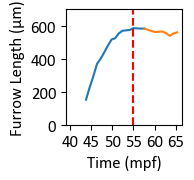

In [24]:
fig, ax = plt.subplots(figsize=[1.5, 1.5])
# ax.plot(dev_time, fu_length*pixel_size, lw=5, color='y')
ax.plot(dev_time[:f_septum1+1], fu_length[:f_septum1+1]*pixel_size)
ax.plot(dev_time[f_septum1:], fu_length[f_septum1:]*pixel_size)
ax.axvline(x=55, color='r', ls='--')
ax.set_ylim(0, 700)
ax.set_yticks(np.arange(0, 650, 200)) 
ax.set_xlim(39, 66.5)
ax.set_xticks(np.arange(40, 67, 5)) 
ax.set_xlabel('Time (mpf)', fontsize=12)
ax.set_ylabel('Furrow Length (\u03BCm)', fontsize=12)
plt.savefig('furrow_length.svg')
plt.show()

np.save('furrow_length.npy', [dev_time, fu_length])

In [32]:
## plotting the data

In [15]:
fu_h_para_nparray, fu_k1_para_nparray, fu_k2_para_nparray, fu_h_perp_nparray, fu_k1_perp_nparray, fu_k2_perp_nparray = [np.load('fu_info_to_export' + str(i) + '.npy') for i in range(6)]
fu_range = np.load('fu_range.npy')
k1, k2 = skimage.io.imread('k1.tif'), skimage.io.imread('k2.tif')
# fu_pro, fu_coord
# fu_pro_perp, fu_coord_perp
# fu_pro_center, fu_coord_center


In [25]:
## plotting about curvature
from matplotlib import colors
time_cmap = plt.colormaps["turbo"]

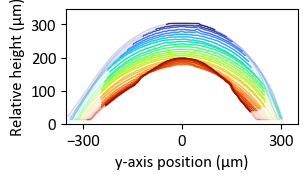

In [26]:
fig, ax = plt.subplots(figsize=[3,2])
for f in np.arange(0,fs,1):
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax.plot((np.arange(ys)-fu_center_y)*pixel_size, fu_h_para_nparray[f]*pixel_size,
                color = time_cmap((f-2)/(fs-2)),
                lw=1, alpha=.2)
        ax.plot(((np.arange(ys)-fu_center_y)*pixel_size)[fu_1:fu_2], (fu_h_para_nparray[f]*pixel_size)[fu_1:fu_2],
                color = time_cmap((f-2)/(fs-2)),
                lw=1)

ax.set_aspect('equal')
ax.set_ylim(0, hs*pixel_size*1.1)
ax.set_yticks(np.arange(0, hs*pixel_size*1.1, 100))
ax.set_xlim(-xs/2*pixel_size*1.1, xs/2*pixel_size*1.1)
ax.set_xticks(np.arange(-300, 301, 300)) 
ax.set_ylabel('Relative height (\u03BCm)')
ax.set_xlabel('y-axis position (\u03BCm)')
plt.savefig('h_xz.svg')
plt.show()

In [27]:
skip = 2
phase_1 = np.arange(3, f_septum1+1, skip)
print(phase_1)
phase_2 = np.arange(f_septum1, fs, skip)
print(phase_2)

[ 3  5  7  9 11 13 15 17 19]
[19 21 23 25 27]


43.79310344827586 - 0.037037037037037035
45.51724137931035 - 0.1111111111111111
47.241379310344826 - 0.18518518518518517
48.96551724137931 - 0.25925925925925924
50.689655172413794 - 0.3333333333333333
52.41379310344828 - 0.4074074074074074
54.13793103448276 - 0.48148148148148145
55.86206896551724 - 0.5555555555555556
57.58620689655172 - 0.6296296296296297
57.58620689655172 - 0.6296296296296297
59.310344827586206 - 0.7037037037037037
61.03448275862069 - 0.7777777777777778
62.758620689655174 - 0.8518518518518519
64.48275862068965 - 0.9259259259259259


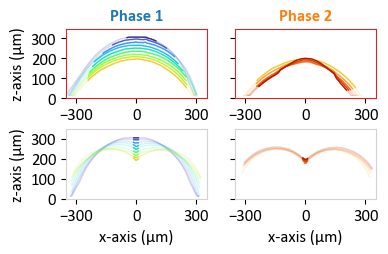

In [28]:
fig, [[ax,ax1], [ax2,ax3]] = plt.subplots(2,2,figsize=[4, 4*0.6], sharey=True)

for f in phase_1:
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax.plot((np.arange(ys)-fu_center_y)*pixel_size, fu_h_para_nparray[f]*pixel_size,
                color = time_cmap((f-2)/(fs-2)),
                lw=1, alpha=.2)
        ax.plot(((np.arange(ys)-fu_center_y)*pixel_size)[fu_1:fu_2], (fu_h_para_nparray[f]*pixel_size)[fu_1:fu_2],
                color = time_cmap((f-2)/(fs-2)),
                lw=1)
        print(dev_time[f], '-', (f-2)/(fs-2))
        
for f in phase_2:
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax1.plot((np.arange(ys)-fu_center_y)*pixel_size, fu_h_para_nparray[f]*pixel_size,
                color = time_cmap((f-2)/(fs-2)),
                lw=1, alpha=.2)
        ax1.plot(((np.arange(ys)-fu_center_y)*pixel_size)[fu_1:fu_2], (fu_h_para_nparray[f]*pixel_size)[fu_1:fu_2],
                color = time_cmap((f-2)/(fs-2)),
                lw=1)
        print(dev_time[f], '-', (f-2)/(fs-2))

band_width = 10

for f in phase_1:
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax2.plot((np.arange(xs)-fu_center_x)*pixel_size, fu_h_perp_nparray[f]*pixel_size,
                color = time_cmap((f-2)/(fs-2)),
                lw=1, alpha=.2)
        ax2.plot(((np.arange(xs)-fu_center_x)*pixel_size)[(int(fu_center_x)-band_width):(int(fu_center_x)+band_width)], (fu_h_perp_nparray[f]*pixel_size)[(int(fu_center_x)-band_width):(int(fu_center_x)+band_width)],
                color = time_cmap((f-2)/(fs-2)),
                lw=1)
        
for f in phase_2:
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax3.plot((np.arange(xs)-fu_center_x)*pixel_size, fu_h_perp_nparray[f]*pixel_size,
                color = time_cmap((f-2)/(fs-2)),
                lw=1, alpha=.2)
        ax3.plot(((np.arange(xs)-fu_center_x)*pixel_size)[(int(fu_center_x)-band_width):(int(fu_center_x)+band_width)], (fu_h_perp_nparray[f]*pixel_size)[(int(fu_center_x)-band_width):(int(fu_center_x)+band_width)],
                color = time_cmap((f-2)/(fs-2)),
                lw=1)

[axs.set_aspect('equal') for axs in [ax,ax1,ax2,ax3]]

[axs.set_ylim(0, hs*pixel_size*1.1) for axs in [ax,ax1,ax2,ax3]]
[axs.set_yticks(np.arange(0, hs*pixel_size*1.1, 100)) for axs in [ax,ax1,ax2,ax3]]
# [axs.set_yticks([]) for axs in [ax,ax1,ax2,ax3]]

[axs.set_xlim(-ys/2*pixel_size*1.1, ys/2*pixel_size*1.1) for axs in [ax,ax1]]
[axs.set_xlim(-xs/2*pixel_size*1.1, xs/2*pixel_size*1.1) for axs in [ax2,ax3]]
[axs.set_xticks(np.arange(-300, 301, 300))  for axs in [ax,ax1,ax2,ax3]]
# [axs.set_xticks([]) for axs in [ax,ax1,ax2,ax3]]


[axs.set_ylabel('z-axis (\u03BCm)') for axs in [ax, ax2]]
[axs.set_xlabel('y-axis (\u03BCm)') for axs in [ax,ax1]]
[axs.set_xlabel('x-axis (\u03BCm)') for axs in [ax2,ax3]]

for axs in [ax, ax1]:
     for spine in axs.spines.values():
        spine.set_edgecolor('tab:red')
for axs in [ax2, ax3]:
     for spine in axs.spines.values():
        spine.set_edgecolor('lightgrey')

ax.set_title('Phase 1', fontsize=12, color='tab:blue', fontweight='bold')
ax1.set_title('Phase 2', fontsize=12, color='tab:orange', fontweight='bold')

plt.savefig('h_xz_yz_phase1_phase2.svg')
plt.show()

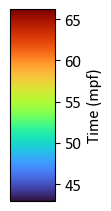

In [84]:
fig, ax = plt.subplots(figsize=(1, 2), layout='constrained')
fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=dev_time[2], vmax=dev_time[-1] + dev_time[1] - dev_time[0]),
                                   cmap='turbo'),
                                   cax=ax, orientation='vertical')
ax.set_ylabel('Time (mpf)', fontsize=12)
plt.savefig('dev_time_colorbar.svg')

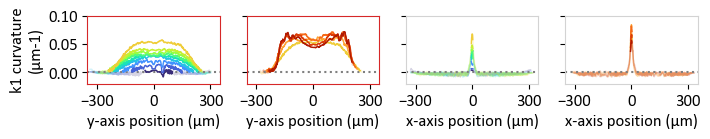

In [116]:
fig, [ax,ax1, ax2,ax3] = plt.subplots(1,4,figsize=[20*1/2.54, 1.5], sharey=True)

for f in phase_1:
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax.plot((np.arange(ys)-fu_center_y)*pixel_size, fu_k1_para_nparray[f]/pixel_size,
                color = time_cmap((f-2)/(fs-2)), 
                lw=1, alpha=.2)
        ax.plot(((np.arange(ys)-fu_center_y)*pixel_size)[fu_1:fu_2], (fu_k1_para_nparray[f]/pixel_size)[fu_1:fu_2],
                color = time_cmap((f-2)/(fs-2)),zorder=10,
                lw=1)
        
for f in phase_2:
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax1.plot((np.arange(ys)-fu_center_y)*pixel_size, fu_k1_para_nparray[f]/pixel_size,
                color = time_cmap((f-2)/(fs-2)),
                lw=1, alpha=.2)
        ax1.plot(((np.arange(ys)-fu_center_y)*pixel_size)[fu_1:fu_2], (fu_k1_para_nparray[f]/pixel_size)[fu_1:fu_2],
                color = time_cmap((f-2)/(fs-2)),zorder=10,
                lw=1)

for f in phase_1:
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax2.plot((np.arange(xs)-fu_center_x)*pixel_size, fu_k1_perp_nparray[f]/pixel_size,
                color = time_cmap((f-2)/(fs-2)),
                lw=1, alpha=.2)
        ax2.plot(((np.arange(xs)-fu_center_x)*pixel_size)[(int(fu_center_x)-3):(int(fu_center_x)+4)], (fu_k1_perp_nparray[f]/pixel_size)[(int(fu_center_x)-3):(int(fu_center_x)+4)],
                color = time_cmap((f-2)/(fs-2)),zorder=10,
                lw=1)
        
for f in phase_2:
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax3.plot((np.arange(xs)-fu_center_x)*pixel_size, fu_k1_perp_nparray[f]/pixel_size,
                color = time_cmap((f-2)/(fs-2)),
                lw=1, alpha=.2)
        ax3.plot(((np.arange(xs)-fu_center_x)*pixel_size)[(int(fu_center_x)-3):(int(fu_center_x)+4)], (fu_k1_perp_nparray[f]/pixel_size)[(int(fu_center_x)-3):(int(fu_center_x)+4)],
                color = time_cmap((f-2)/(fs-2)),zorder=10,
                lw=1)

[axs.axhline(y=0, color='grey', ls=':') for axs in [ax,ax1,ax2,ax3]]

[axs.set_aspect(3000) for axs in [ax,ax1,ax2,ax3]]

[axs.set_ylim(-0.02, 0.1) for axs in [ax,ax1,ax2,ax3]]
[axs.set_yticks([0, 0.05, 0.1]) for axs in [ax,ax1,ax2,ax3]]

[axs.set_xlim(-ys/2*pixel_size*1.1, ys/2*pixel_size*1.1) for axs in [ax,ax1]]
[axs.set_xlim(-xs/2*pixel_size*1.1, xs/2*pixel_size*1.1) for axs in [ax2,ax3]]
[axs.set_xticks(np.arange(-300, 301, 300))  for axs in [ax,ax1,ax2,ax3]]

[axs.set_ylabel('k1 curvature\n(\u03BCm-1)') for axs in [ax]]
[axs.set_xlabel('y-axis position (\u03BCm)') for axs in [ax,ax1]]
[axs.set_xlabel('x-axis position (\u03BCm)') for axs in [ax2,ax3]]

for axs in [ax, ax1]:
     for spine in axs.spines.values():
        spine.set_edgecolor('tab:red')
for axs in [ax2, ax3]:
     for spine in axs.spines.values():
        spine.set_edgecolor('lightgrey')

# ax.set_title('Phase 1', fontsize=12)
# ax1.set_title('Phase 2', fontsize=12)

plt.savefig('k1_xz_yz_phase1_phase2.svg')
plt.show()

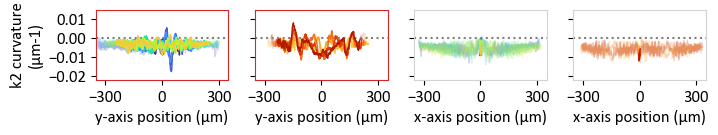

In [117]:
fig, [ax,ax1, ax2,ax3] = plt.subplots(1,4,figsize=[20*1/2.54, 1.5], sharey=True)

for f in phase_1:
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax.plot((np.arange(ys)-fu_center_y)*pixel_size, fu_k2_para_nparray[f]/pixel_size,
                color = time_cmap((f-2)/(fs-2)),
                lw=1, alpha=.2)
        ax.plot(((np.arange(ys)-fu_center_y)*pixel_size)[fu_1:fu_2], (fu_k2_para_nparray[f]/pixel_size)[fu_1:fu_2],
                color = time_cmap((f-2)/(fs-2)),zorder=10,
                lw=1)
        
for f in phase_2:
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax1.plot((np.arange(ys)-fu_center_y)*pixel_size, fu_k2_para_nparray[f]/pixel_size,
                color = time_cmap((f-2)/(fs-2)),
                lw=1, alpha=.2)
        ax1.plot(((np.arange(ys)-fu_center_y)*pixel_size)[fu_1:fu_2], (fu_k2_para_nparray[f]/pixel_size)[fu_1:fu_2],
                color = time_cmap((f-2)/(fs-2)),zorder=10,
                lw=1)

for f in phase_1:
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax2.plot((np.arange(xs)-fu_center_x)*pixel_size, fu_k2_perp_nparray[f]/pixel_size,
                color = time_cmap((f-2)/(fs-2)),
                lw=1, alpha=.2)
        ax2.plot(((np.arange(xs)-fu_center_x)*pixel_size)[(int(fu_center_x)-3):(int(fu_center_x)+4)], (fu_k2_perp_nparray[f]/pixel_size)[(int(fu_center_x)-3):(int(fu_center_x)+4)],
                color = time_cmap((f-2)/(fs-2)),zorder=10,
                lw=1)
        
for f in phase_2:
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax3.plot((np.arange(xs)-fu_center_x)*pixel_size, fu_k2_perp_nparray[f]/pixel_size,
                color = time_cmap((f-2)/(fs-2)),
                lw=1, alpha=.2)
        ax3.plot(((np.arange(xs)-fu_center_x)*pixel_size)[(int(fu_center_x)-3):(int(fu_center_x)+4)], (fu_k2_perp_nparray[f]/pixel_size)[(int(fu_center_x)-3):(int(fu_center_x)+4)],
                color = time_cmap((f-2)/(fs-2)),zorder=10,
                lw=1)

[axs.axhline(y=0, color='grey', ls=':') for axs in [ax,ax1,ax2,ax3]]

[axs.set_aspect(10000) for axs in [ax,ax1,ax2,ax3]]

[axs.set_ylim(-0.022, 0.015) for axs in [ax,ax1,ax2,ax3]]
[axs.set_yticks([-0.02, -0.01, 0, 0.01]) for axs in [ax,ax1,ax2,ax3]]


[axs.set_xlim(-ys/2*pixel_size*1.1, ys/2*pixel_size*1.1) for axs in [ax,ax1]]
[axs.set_xlim(-xs/2*pixel_size*1.1, xs/2*pixel_size*1.1) for axs in [ax2,ax3]]
[axs.set_xticks(np.arange(-300, 301, 300))  for axs in [ax,ax1,ax2,ax3]]

[axs.set_ylabel('k2 curvature\n(\u03BCm-1)') for axs in [ax]]
[axs.set_xlabel('y-axis position (\u03BCm)') for axs in [ax,ax1]]
[axs.set_xlabel('x-axis position (\u03BCm)') for axs in [ax2,ax3]]

for axs in [ax, ax1]:
     for spine in axs.spines.values():
        spine.set_edgecolor('tab:red')
for axs in [ax2, ax3]:
     for spine in axs.spines.values():
        spine.set_edgecolor('lightgrey')

# ax.set_title('Phase 1', fontsize=12)
# ax1.set_title('Phase 2', fontsize=12)

plt.savefig('k2_xz_yz_phase1_phase2.svg')
plt.show()

In [17]:
actin_cable_positions = pd.read_csv('cbroi.csv')[['X', 'Y', 'Slice']]
actin_cable_positions['Slice'] = actin_cable_positions['Slice']-1
actin_cable_positions = actin_cable_positions.sort_values(['Slice', 'Y']).reset_index().drop(columns='index')

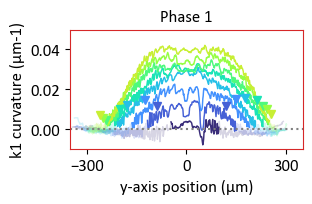

In [25]:
fig, ax = plt.subplots(figsize=[3,2])
for f in phase_1[:-1]:
# for f in [13]:
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax.plot((np.arange(ys)-fu_center_y)*pixel_size, fu_k1_para_nparray[f]/pixel_size + f*0.000,
                color = time_cmap((f-2)/(fs-2)),
                lw=1, alpha=0.2)
        ax.plot(((np.arange(ys)-fu_center_y)*pixel_size)[fu_1:fu_2], (fu_k1_para_nparray[f]/pixel_size)[fu_1:fu_2] + f*0.000,
                color = time_cmap((f-2)/(fs-2)),
                lw=1)
        
        actin_cable = actin_cable_positions.loc[actin_cable_positions['Slice'] == f]['Y']
        ax.plot(actin_cable-fu_center_y*pixel_size, fu_k1_para_nparray[f][(actin_cable/pixel_size).astype('int')]/pixel_size + 0.005 + f*0.000, 'v',
                color = time_cmap((f-2)/(fs-2)),  zorder=10)

ax.axhline(y=0, color='grey', ls=':')

ax.set_aspect(6000)

ax.set_ylim(-0.01, 0.05)

ax.set_xlim(-ys/2*pixel_size*1.1, ys/2*pixel_size*1.1)
ax.set_xticks(np.arange(-300, 301, 300))

ax.set_ylabel('k1 curvature (\u03BCm-1)')
ax.set_xlabel('y-axis position (\u03BCm)')

for spine in ax.spines.values():
        spine.set_edgecolor('tab:red')


ax.set_title('Phase 1', fontsize=12)
ax1.set_title('Phase 2', fontsize=12)

plt.savefig('k1_yz_phase1_with_actin.svg')
plt.show()

3
5
7
9
11
13
15
17


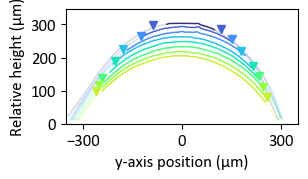

In [26]:
fig, ax = plt.subplots(figsize=[3,2])
# for f in np.arange(fs):
for f in phase_1[:-1]:
# for f in [8]:
    print(f)
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax.plot((np.arange(ys)-fu_center_y)*pixel_size, fu_h_para_nparray[f]*pixel_size,
                color = time_cmap((f-2)/(fs-2)),
                lw=1, alpha=.2)
        ax.plot(((np.arange(ys)-fu_center_y)*pixel_size)[fu_1:fu_2], (fu_h_para_nparray[f]*pixel_size)[fu_1:fu_2],
                color = time_cmap((f-2)/(fs-2)),
                lw=1)
        
        actin_cable = actin_cable_positions.loc[actin_cable_positions['Slice'] == f]['Y']

        ax.plot(actin_cable-fu_center_y*pixel_size, fu_h_para_nparray[f][(actin_cable/pixel_size).astype('int')] * pixel_size+20, marker = 'v', ls = 'none',
                color = time_cmap((f-2)/(fs-2)),  zorder=10)

ax.set_aspect('equal')
ax.set_ylim(0, hs*pixel_size*1.1)
ax.set_yticks(np.arange(0, hs*pixel_size*1.1, 100))
ax.set_xlim(-xs/2*pixel_size*1.1, xs/2*pixel_size*1.1)
ax.set_xticks(np.arange(-300, 301, 300)) 
ax.set_ylabel('Relative height (\u03BCm)')
ax.set_xlabel('y-axis position (\u03BCm)')
plt.savefig('cf_labeling_xz_with_actin.svg')
plt.show()

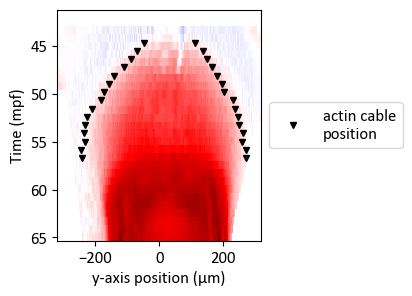

In [27]:
fig, ax = plt.subplots(figsize=[3,3])
ax.imshow(fu_k1_para_nparray, vmin=-0.1, vmax=0.1, aspect=30, cmap='seismic', interpolation='none', extent=[-ys/2*pixel_size, ys/2*pixel_size, dev_time[-1],dev_time[0]])

ax.plot(actin_cable_positions['Y'] -ys/2*pixel_size, dev_time[actin_cable_positions['Slice']], 'v', color='black', markersize= 5, label='actin cable\nposition')

# ax.set_xlim(dev_time[2], dev_time[f_septum1])
ax.set_ylabel('Time (mpf)')
ax.set_xlabel('y-axis position (\u03BCm)')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=True, fontsize=12)
plt.show()

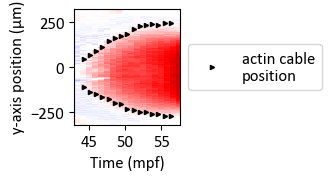

In [28]:
fig, ax = plt.subplots(figsize=[1.5, 1.5])
ax.imshow(np.swapaxes(fu_k1_para_nparray,0,1), vmin=-0.1, vmax=0.1, aspect=1/40, cmap='seismic', interpolation='none', extent=[dev_time[0],dev_time[-1],  -ys/2*pixel_size, ys/2*pixel_size])

ax.plot(dev_time[actin_cable_positions['Slice']] - time_interval/60*0.5, ys*pixel_size - actin_cable_positions['Y'] -ys/2*pixel_size,  '>', color='black', markersize= 3, label='actin cable\nposition')

ax.set_xlim(dev_time[2], dev_time[f_septum1])
ax.set_xlabel('Time (mpf)')
ax.set_ylabel('y-axis position (\u03BCm)')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=True, fontsize=12)
plt.savefig('k1_kymo_with_actin.svg')
plt.show()

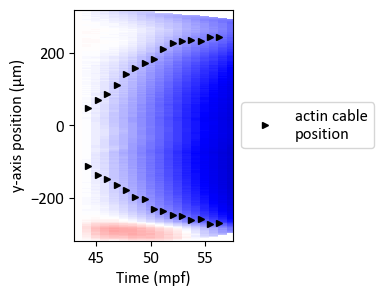

In [47]:
fu_h_para_nparray_rotate = np.swapaxes(fu_h_para_nparray,0,1)

fig, ax = plt.subplots(figsize=[3,3])
ax.imshow(fu_h_para_nparray_rotate - np.repeat(fu_h_para_nparray_rotate[:, 2], fs).reshape(ys, fs),
          vmin=-150, vmax=150, aspect=1/30, cmap='seismic', interpolation='none', extent=[dev_time[0],dev_time[-1],  -ys/2*pixel_size, ys/2*pixel_size])

ax.plot(dev_time[actin_cable_positions['Slice']] - time_interval/60*0.5, ys*pixel_size - actin_cable_positions['Y'] -ys/2*pixel_size,  '>', color='black', markersize= 5, label='actin cable\nposition')

ax.set_xlim(dev_time[2], dev_time[f_septum1])
ax.set_xlabel('Time (mpf)')
ax.set_ylabel('y-axis position (\u03BCm)')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=True, fontsize=12)
plt.savefig('deepening_kymo_with_actin.svg')
plt.show()

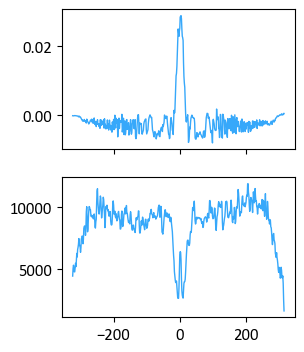

In [48]:
fig, [ax2, ax3] = plt.subplots(2,1,figsize=[3,4], sharex=True)
# for f in phase_1:
for f in [8]:
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)
        ax2.plot((np.arange(xs)-fu_center_x)*pixel_size, fu_k1_perp_nparray[f]/pixel_size,
                color = time_cmap((f-2)/(fs-2)),
                lw=1, alpha=1)
        a = mask_kymo(fu_pro_perp[f], data_raw_max[f], axis='x', iterations = 5)
        # ax22 = ax2.twinx()
        ax3.plot((np.arange(xs)-fu_center_x)*pixel_size, a,
                color = time_cmap((f-2)/(fs-2)), 
                lw=1, alpha=1, zorder=5)
        # ax2.plot(((np.arange(xs)-fu_center_x)*pixel_size)[(int(fu_center_x)-3):(int(fu_center_x)+4)], (fu_k1_perp_nparray[f]/pixel_size)[(int(fu_center_x)-3):(int(fu_center_x)+4)],
        #         color = time_cmap((f-2)/(fs-2)),
        #         lw=1)

ax.set_aspect('equal')
ax.set_ylim(0, hs*pixel_size*1.1)
ax.set_yticks(np.arange(0, hs*pixel_size*1.1, 100))
ax.set_xlim(-xs/2*pixel_size*1.1, xs/2*pixel_size*1.1)
ax.set_xticks(np.arange(-300, 301, 300)) 
ax.set_ylabel('Relative height (\u03BCm)')
ax.set_xlabel('y-axis position (\u03BCm)')
# plt.savefig('cf_labeling_xz_with_actin.svg')
plt.show()

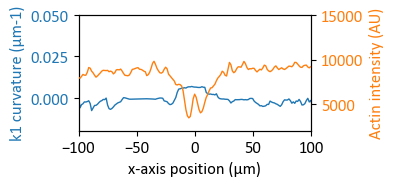

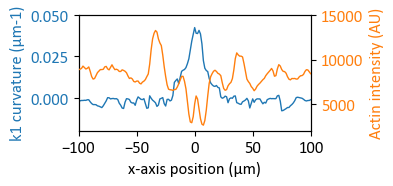

In [29]:

# for f in phase_1:
for f in [5,14 ]:
    fig, ax2 = plt.subplots(figsize=[3,1.5])
    _, fu_center_y, fu_center_x = fu_coord_center[f]
    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):
        fu_1, fu_2 = int(fu_1), int(fu_2)

        # b = mask_kymo(fu_pro_perp[f], k1[f], axis='x', iterations = 3)
        ax2.plot((np.arange(xs)-fu_center_x)*pixel_size, fu_k1_perp_nparray[f]/pixel_size, #b/pixel_size, 
                color = "tab:blue",
                lw=1, alpha=1)
        
        a = mask_kymo(fu_pro_perp[f], data_raw_max[f], axis='x', iterations = 15)
        ax22 = ax2.twinx()
        ax22.plot((np.arange(xs)-fu_center_x)*pixel_size, a,
                color = "tab:orange", 
                lw=1, alpha=1, zorder=5)
        # ax2.plot(((np.arange(xs)-fu_center_x)*pixel_size)[(int(fu_center_x)-3):(int(fu_center_x)+4)], (fu_k1_perp_nparray[f]/pixel_size)[(int(fu_center_x)-3):(int(fu_center_x)+4)],
        #         color = time_cmap((f-2)/(fs-2)),
        #         lw=1)


    ax2.set_xlabel('x-axis position (\u03BCm)')
    ax2.set_ylabel('k1 curvature (\u03BCm-1)', color='tab:blue')
    ax2.tick_params(axis='y', labelcolor='tab:blue')

    ax22.set_ylabel('Actin intensity (AU)', color='tab:orange')
    ax22.tick_params(axis='y', labelcolor='tab:orange')

    # ax2.set_xlim(-xs/2*pixel_size*1.1, xs/2*pixel_size*1.1)
    ax2.set_xlim(-100, 100)
    ax2.set_ylim(-0.02, 0.05)
    ax22.set_ylim(2000, 15000)
    # ax2.set_xticks(np.arange(-300, 301, 300)) 

    plt.savefig('k1_actin_intensity_f' + str(f) + '.svg')
    plt.show()

In [29]:
def curvature(xs, ys):
    y_prime = derivative(xs, ys)
    y_double_prime = derivative(xs, y_prime)
    return np.abs(y_double_prime) / (1 + y_prime**2)**(3/2)


def compute_curvature(points):
    points = np.array(points)
    points = np.swapaxes(points,0,1)

    # First derivative (tangent vector)

    dr = np.gradient(points, axis=0)
    # dr = derivative(points)
    dr_norm = np.linalg.norm(dr, axis=1, keepdims=True)
    T = dr / dr_norm  # Unit tangent vector
    
    # Second derivative
    dT = np.gradient(T, axis=0)
    # dT = derivative(T)
    dT_norm = np.linalg.norm(dT, axis=1)
    
    # Compute curvature
    curvature = dT_norm / dr_norm.flatten()
    
    return curvature
    
from scipy.optimize import leastsq, least_squares

def fit_circle_3d(points):
    # Step 1: Fit a plane via SVD
    centroid = points.mean(axis=0)
    U, S, Vt = np.linalg.svd(points - centroid)
    normal = Vt[2, :]

    # Step 2: Project points onto the plane
    def project_point(p):
        return p - np.dot(p - centroid, normal) * normal

    projected = np.array([project_point(p) for p in points])

    # Step 3: Define 2D coordinate system on the plane
    u = Vt[0, :]
    v = Vt[1, :]

    x = np.dot(projected - centroid, u)
    y = np.dot(projected - centroid, v)

    # Step 4: Fit circle in 2D
    def calc_R(xc, yc):
        return np.sqrt((x - xc)**2 + (y - yc)**2)

    def residuals(c):
        Ri = calc_R(*c)
        return Ri - Ri.mean()

    center_estimate = (0, 0)
    result = least_squares(residuals, center_estimate)

    center_2d = result.x
    radius = calc_R(*center_2d).mean()

    # Step 5: Map center back to 3D
    center_3d = centroid + center_2d[0]*u + center_2d[1]*v

    return center_3d, normal, radius


def fit_circle_2d(points):
    
    # Compute the initial guess for the center
    x_m, y_m = np.mean(points, axis=0)
    
    def calc_R(xc, yc):
        """Calculate distance of each point from the center (xc, yc)."""
        return np.sqrt((points[:, 0] - xc)**2 + (points[:, 1] - yc)**2)
    
    def f_2(c):
        """Calculate algebraic distance between data points and mean circle."""
        Ri = calc_R(*c)
        return Ri - Ri.mean()
    
    # Initial guess for the center
    center_estimate = (x_m, y_m)
    center, _ = leastsq(f_2, center_estimate)
    xc, yc = center
    
    # Compute the radius as the mean distance to the center
    R = calc_R(xc, yc)
    r = R.mean()
    
    return xc, yc, r


200.89168759488496 	 200.13330571308393
208.76336494073877 	 208.31999312865807
212.13316445468652 	 211.70556237424694
220.70011498356774 	 220.42533598010334
226.56421866844357 	 226.43461188012165
230.65786302011753 	 230.6188455965821
234.386128691023 	 234.37846836870528
235.69162038284057 	 235.68412143298266
236.51751761127346 	 236.51751761511306
240.6191663105983 	 240.60827956347174
244.18846378840695 	 244.18308727885574
245.19792900398343 	 245.18054646667713
246.54973736359418 	 246.53953565219712
246.25559013047098 	 246.2032457760865
245.5475892822908 	 245.44186590362142
244.3287251226434 	 244.20256164542312
240.44536803670115 	 240.2738627219538
235.54025373383763 	 235.37573264327017
229.4208980411006 	 229.30797465000228
221.13259488509638 	 220.95954737456583
210.7880053101637 	 210.66019532512323
200.91237314620741 	 200.71213087000055
187.39895222876441 	 187.2640560262767
174.21753897704824 	 174.0874087320233
171.5281673678611 	 171.4025285148576
169.1525334589

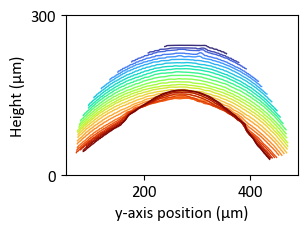

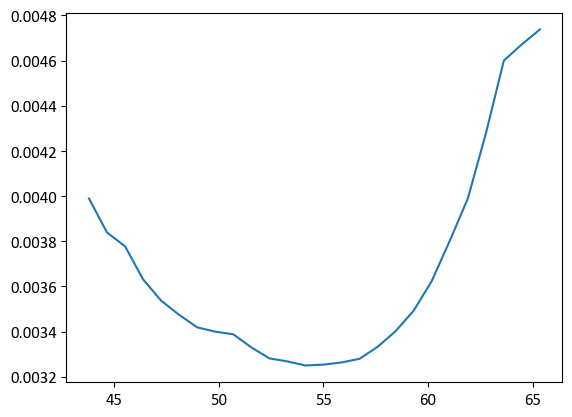

In [30]:
curs = []

fig, ax = plt.subplots(figsize=[3,3])
# for f in range(0, f_septum1+1):
for f in range(fs):

    fu_1, fu_2 = fu_range[f]
    if not np.isnan(fu_1):

        Z = fu_h_para_nparray[f][int(fu_1):int(fu_2)]
        Y = fu_coord[f][1][0][int(fu_1):int(fu_2)]
        X = fu_coord[f][1][1][int(fu_1):int(fu_2)]
        
        points = np.array([X, Y, Z])
        points = np.swapaxes(points, 0,1)
        c3d, n, r = fit_circle_3d(points)

        points = np.array([Y, Z])
        points = np.swapaxes(points, 0,1)
        xc2, yc2, r2 = fit_circle_2d(np.swapaxes(np.array([Y, Z]), 0,1))
        
        curs.append([r*pixel_size, 1/(r*pixel_size), r2*pixel_size, 1/(r2*pixel_size)])
        print(r, '\t',r2)

        ax.plot(Y,Z, color = time_cmap((f-2)/(fs-3)), lw=1)
    else:
        curs.append([np.nan]*4)

ax.set_aspect('equal')
ax.set_ylim(0, hs*1.1)
ax.set_yticks(np.arange(0, 301, 300))
# ax.set_xlim(-xs/2*pixel_size*1.1, xs/2*pixel_size*1.1)
# ax.set_xticks(np.arange(-300, 301, 300)) 
ax.set_ylabel('Height (\u03BCm)')
ax.set_xlabel('y-axis position (\u03BCm)')
plt.savefig('cf_labeling_xz.svg')
plt.show()

curs = np.array(curs)
curs = np.swapaxes(curs, 0, 1)

np.save('furrow_curvature.npy', curs)

fig,ax=plt.subplots()
ax.plot(dev_time, curs[1])
plt.show()

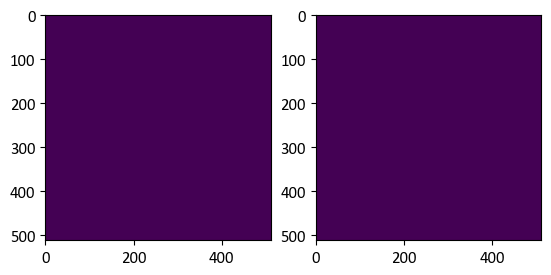

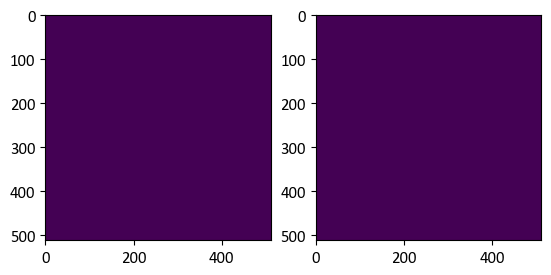

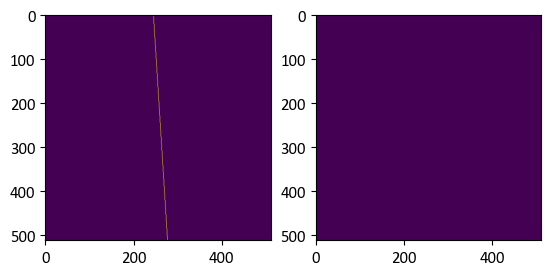

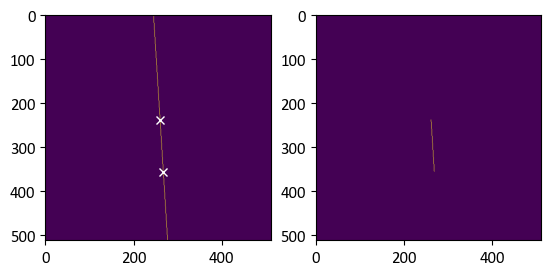

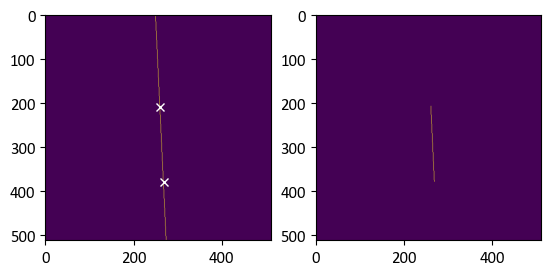

...

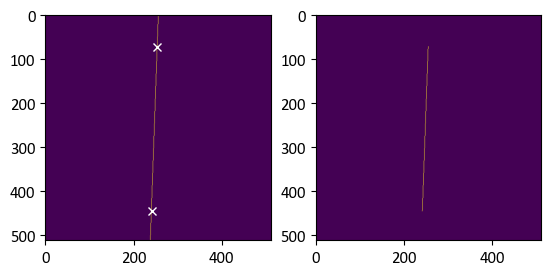

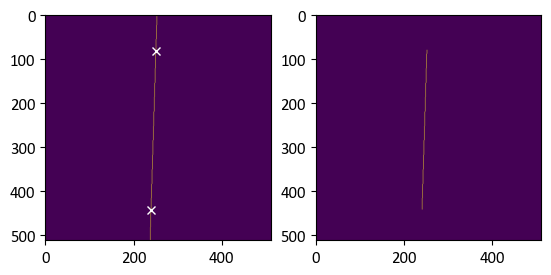

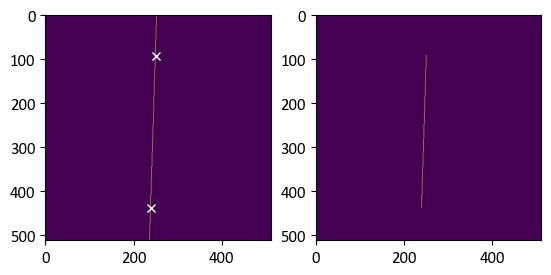

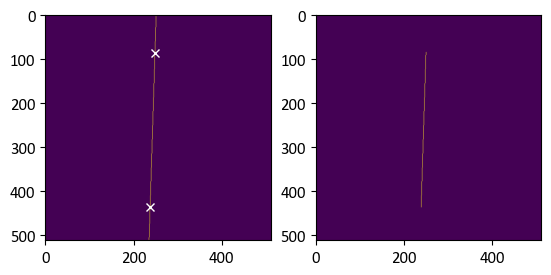

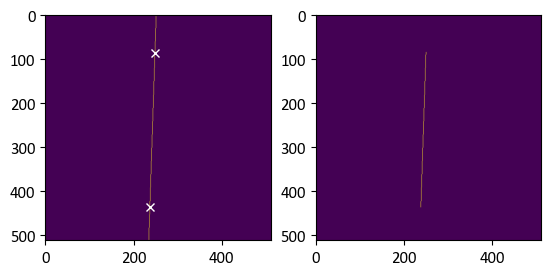

In [18]:
fu_position_binary = np.zeros_like(fu_pro)

for f in range(fs):
    fig,axs=plt.subplots(1,2)
    axs[0].imshow(fu_pro[f])
    if not np.isnan(fu_range[f][0]):
        fu_start, fu_end = fu_range[f].astype('int')
        fu_position_binary[f, fu_start:fu_end+1] = fu_pro[f, fu_start:fu_end+1]
        axs[0].plot(fu_coord[f][1][1][[fu_start,fu_end]], fu_coord[f][1][0][[fu_start,fu_end]], 'x', color='white')
    axs[1].imshow(fu_position_binary[f])
    plt.show()

2


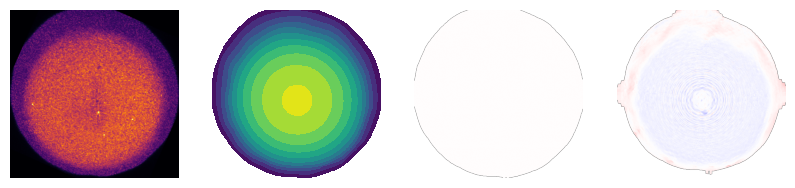

5


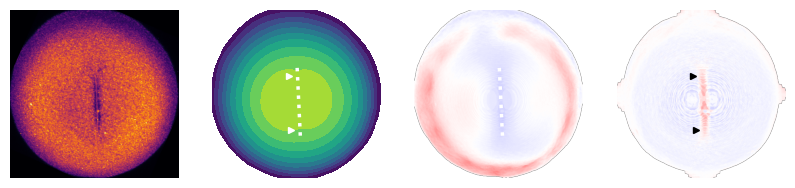

8


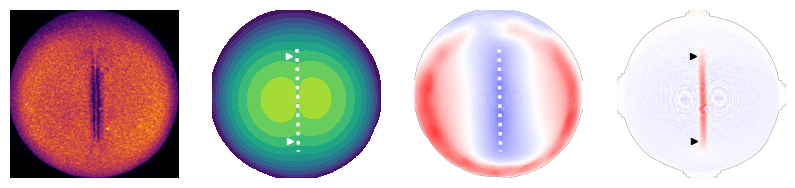

11


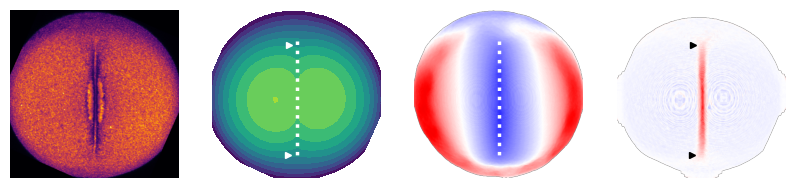

14


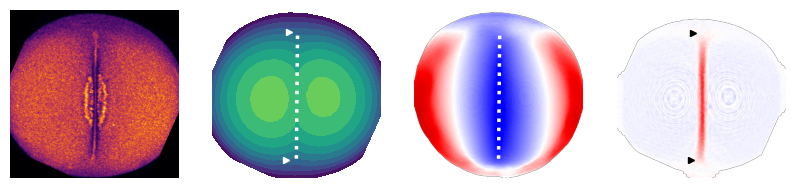

17


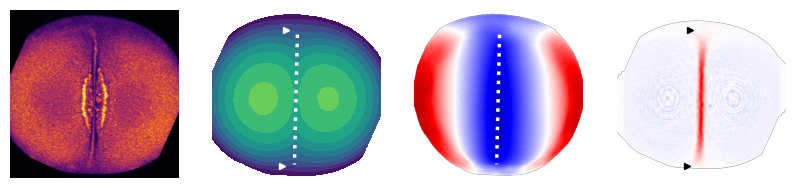

In [ ]:
frames_to_show_in_figures2 = np.arange(24, 41, 3) -22
k_range = 0.1
levels = np.arange(0, hs*pixel_size+31, 30)

folder_export_height_actin_match_illu = 'height_actin_match_illu'
create_folder(folder_export_height_actin_match_illu)


for f in frames_to_show_in_figure4:
# for f in range(0, f_septum1, 1):
    print(f)
    fig,axs=plt.subplots(1,4, figsize=[10, 2.5])
    # plt.imshow(height[f])
    axs[0].imshow(data_raw_max[f], vmin=top_view_vmin, vmax=top_view_vmax, cmap='inferno')
    axs[1].contourf(height[f]*pixel_size, levels = levels, cmap='viridis')
    axs[1].set_aspect('equal')
    axs[1].invert_yaxis()

    if f>=4:
        axs[1].plot(actin_cable_positions.loc[actin_cable_positions['Slice'] == f]['X'] / pixel_size - 25,
                    actin_cable_positions.loc[actin_cable_positions['Slice'] == f]['Y'] / pixel_size,
                    marker = '>', color = 'white', markersize = 5, ls='none', zorder=10)
        axs[3].plot(actin_cable_positions.loc[actin_cable_positions['Slice'] == f]['X'] / pixel_size - 25,
                    actin_cable_positions.loc[actin_cable_positions['Slice'] == f]['Y'] / pixel_size,
                    marker = '>', color = 'black', markersize = 5, ls='none', zorder=10)

    if not np.isnan(fu_range[f][0]):
        fu_start, fu_end = fu_range[f].astype('int')
        # axs[0].plot(fu_coord[f][1][1][fu_start:fu_end]-20, fu_coord[f][1][0][fu_start:fu_end], color='white', lw=2, ls=':')
        # axs[0].plot(fu_coord[f][1][1][fu_start:fu_end]+20, fu_coord[f][1][0][fu_start:fu_end], color='white', lw=2, ls=':')
        
        # axs[0].contour(scipy.ndimage.binary_dilation(fu_position_binary[f], iterations = 20), colors = 'white', linestyles = '--')
        # axs[1].contour(scipy.ndimage.binary_dilation(fu_position_binary[f], iterations = 20), colors = 'white', linestyles = '--')
        # axs[2].contour(scipy.ndimage.binary_dilation(fu_position_binary[f], iterations = 20), colors = 'white', linestyles = '--')
        # axs[1].plot(fu_coord[f][1][1][[fu_start,fu_end]], fu_coord[f][1][0][[fu_start,fu_end]], 'x', color='white')
        
        
        axs[1].plot(fu_coord[f][1][1][fu_start:fu_end], fu_coord[f][1][0][fu_start:fu_end], color='white', lw=2.5, alpha=1, ls = ':', solid_capstyle='round')
        axs[2].plot(fu_coord[f][1][1][fu_start:fu_end], fu_coord[f][1][0][fu_start:fu_end], color='white', lw=2.5, alpha=1, ls = ':', solid_capstyle='round')
        # axs[1].plot(fu_coord[f][1][1][[fu_start,fu_end]], fu_coord[f][1][0][[fu_start,fu_end]], color='white')

    
    axs[2].imshow((height[f] - height[frames_to_show_in_figure4[0]])*pixel_size, cmap='seismic', vmin=-150, vmax=150)
    axs[3].imshow(k1[f]/pixel_size, cmap='seismic', vmin=-k_range, vmax=k_range)

    [ax.set_axis_off() for ax in axs]
    plt.savefig(folder_export_height_actin_match_illu + '\\f' + str(f) + '.svg', bbox_inches='tight', pad_inches=0)
    plt.show()

2


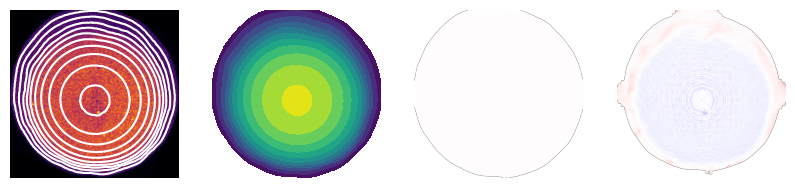

5


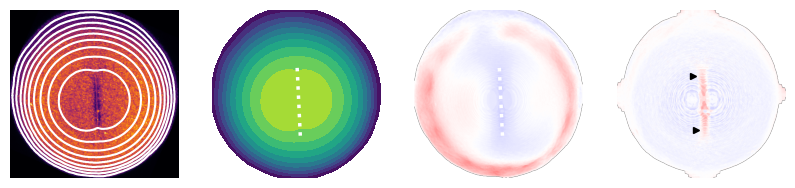

8


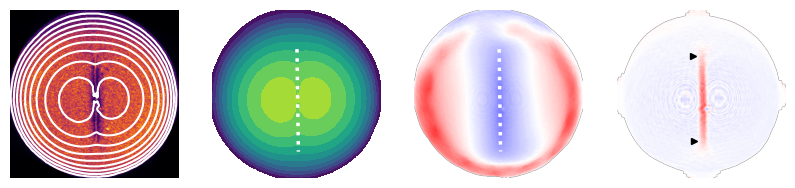

11


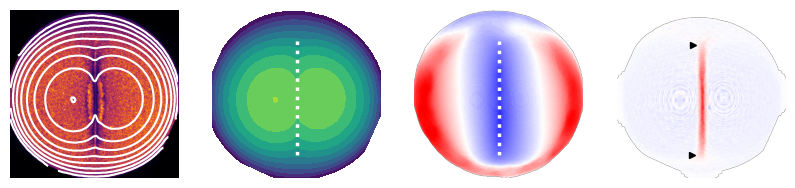

14


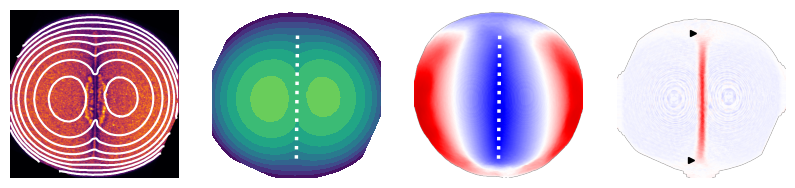

17


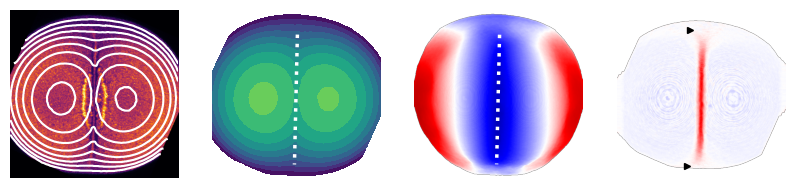

In [299]:
frames_to_show_in_figure4 = np.arange(24, 41, 3) -22
k_range = 0.1
levels = np.arange(0, hs*pixel_size+31, 30)

folder_export_height_actin_match_illu = 'height_actin_match_illu'
create_folder(folder_export_height_actin_match_illu)


for f in frames_to_show_in_figure4:
# for f in [8]:
    print(f)
    fig,axs=plt.subplots(1,4, figsize=[10, 2.5])
    # plt.imshow(height[f])
    axs[0].imshow(data_raw_max[f], vmin=top_view_vmin, vmax=top_view_vmax, cmap='inferno')
    axs[0].contour(height[f]*pixel_size, levels = levels, colors='white')
    axs[1].contourf(height[f]*pixel_size, levels = levels, cmap='viridis')
    axs[1].set_aspect('equal')
    axs[1].invert_yaxis()

    if f>=4:
        # axs[0].plot(actin_cable_positions.loc[actin_cable_positions['Slice'] == f]['X'] / pixel_size - 25,
        #             actin_cable_positions.loc[actin_cable_positions['Slice'] == f]['Y'] / pixel_size,
        #             marker = 9, color = 'white', markersize = 5, ls='none', zorder=10)
        axs[3].plot(actin_cable_positions.loc[actin_cable_positions['Slice'] == f]['X'] / pixel_size - 25,
                    actin_cable_positions.loc[actin_cable_positions['Slice'] == f]['Y'] / pixel_size,
                    marker = '>', color = 'black', markersize = 5, ls='none', zorder=10)

    if not np.isnan(fu_range[f][0]):
        fu_start, fu_end = fu_range[f].astype('int')
        # axs[0].plot(fu_coord[f][1][1][fu_start:fu_end]-20, fu_coord[f][1][0][fu_start:fu_end], color='white', lw=2, ls=':')
        # axs[0].plot(fu_coord[f][1][1][fu_start:fu_end]+20, fu_coord[f][1][0][fu_start:fu_end], color='white', lw=2, ls=':')
        
        # axs[0].contour(scipy.ndimage.binary_dilation(fu_position_binary[f], iterations = 20), colors = 'white', linestyles = '--')
        # axs[1].contour(scipy.ndimage.binary_dilation(fu_position_binary[f], iterations = 20), colors = 'white', linestyles = '--')
        # axs[2].contour(scipy.ndimage.binary_dilation(fu_position_binary[f], iterations = 20), colors = 'white', linestyles = '--')
        # axs[1].plot(fu_coord[f][1][1][[fu_start,fu_end]], fu_coord[f][1][0][[fu_start,fu_end]], 'x', color='white')
        
        
        axs[1].plot(fu_coord[f][1][1][fu_start:fu_end], fu_coord[f][1][0][fu_start:fu_end], color='white', lw=2.5, alpha=1, ls = ':', solid_capstyle='round')
        axs[2].plot(fu_coord[f][1][1][fu_start:fu_end], fu_coord[f][1][0][fu_start:fu_end], color='white', lw=2.5, alpha=1, ls = ':', solid_capstyle='round')
        # axs[1].plot(fu_coord[f][1][1][[fu_start,fu_end]], fu_coord[f][1][0][[fu_start,fu_end]], color='white')

    
    axs[2].imshow((height[f] - height[frames_to_show_in_figure4[0]])*pixel_size, cmap='seismic', vmin=-150, vmax=150)
    axs[3].imshow(k1[f]/pixel_size, cmap='seismic', vmin=-k_range, vmax=k_range)

    [ax.set_axis_off() for ax in axs]
    plt.savefig(folder_export_height_actin_match_illu + '\\f' + str(f) + '_huge.svg', bbox_inches='tight', pad_inches=0)
    plt.show()

0


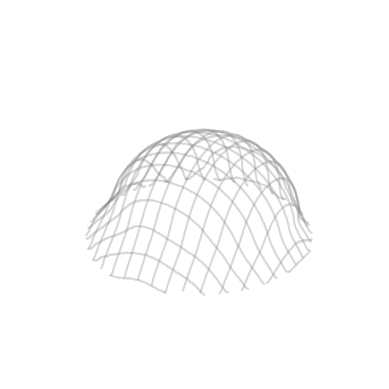

1


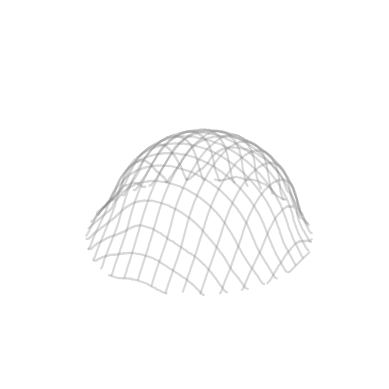

2


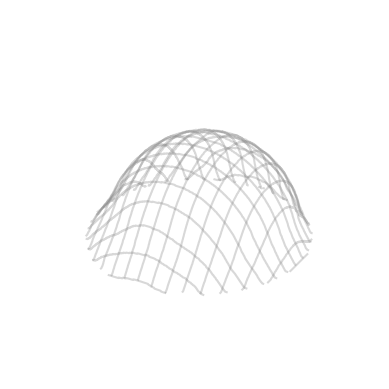

3


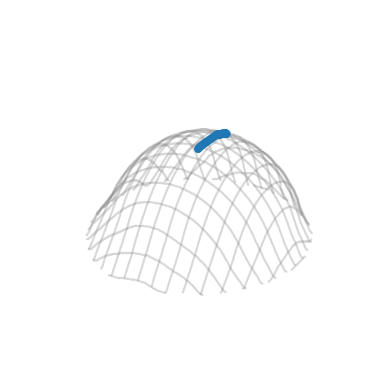

4


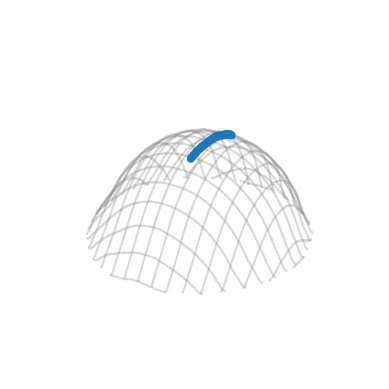

5


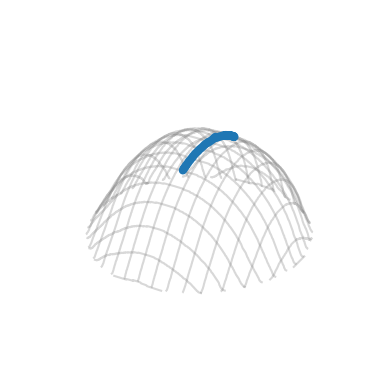

6


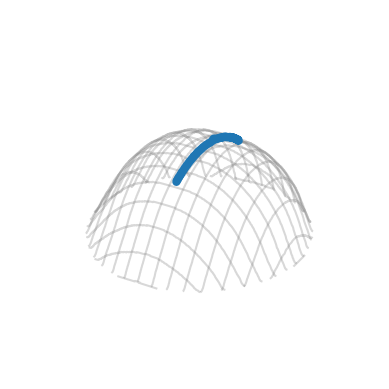

7


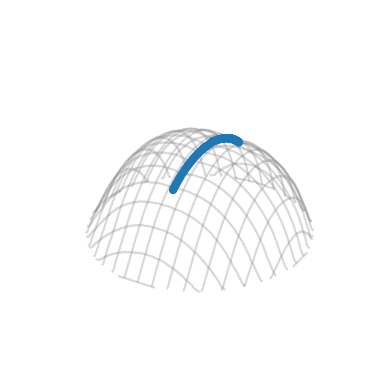

8


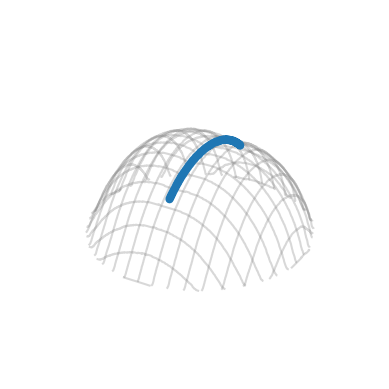

9


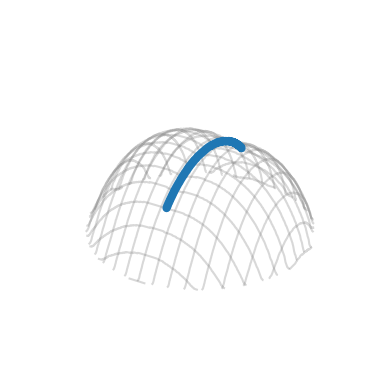

10


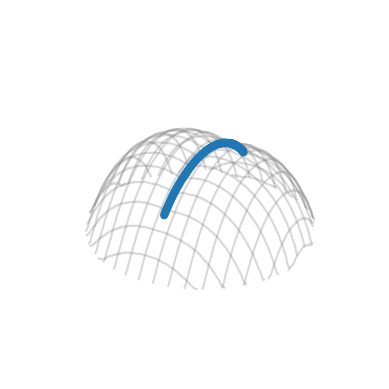

11


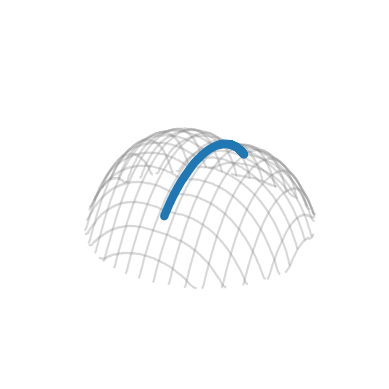

12


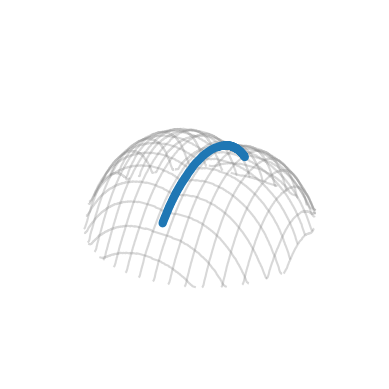

13


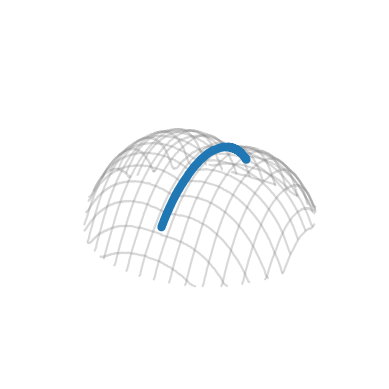

14


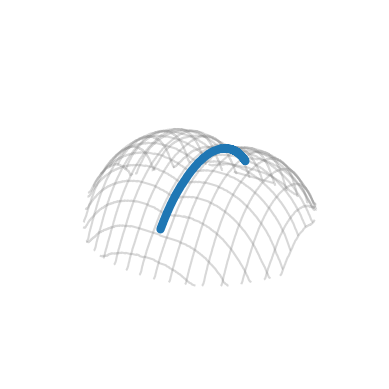

15


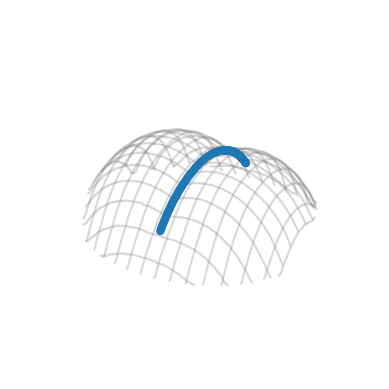

16


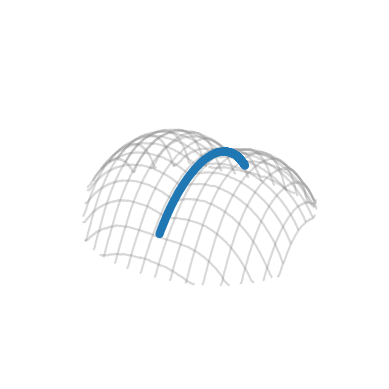

17


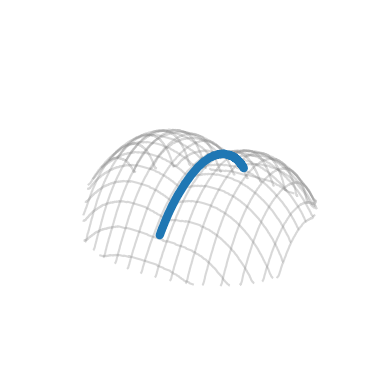

18


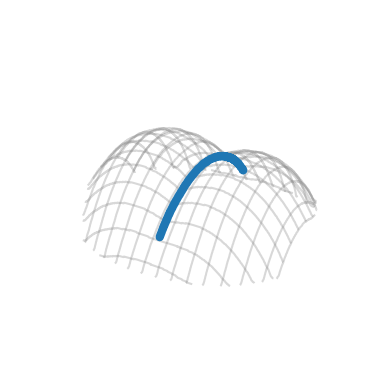

19


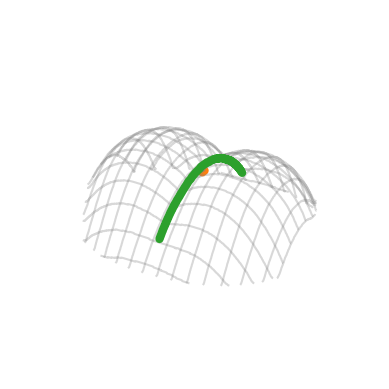

20


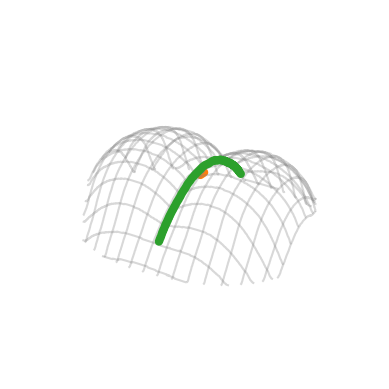

21


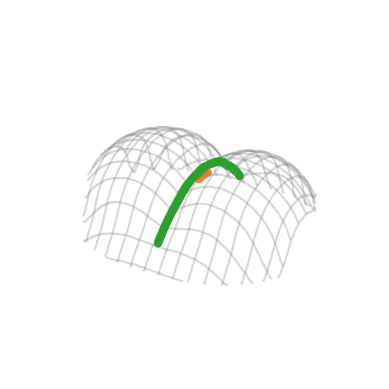

22


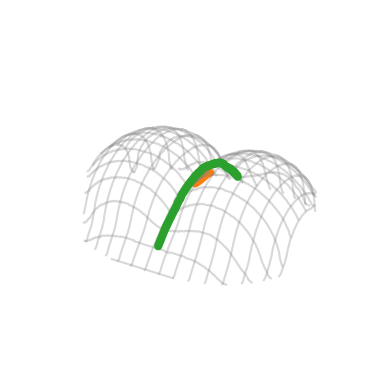

23


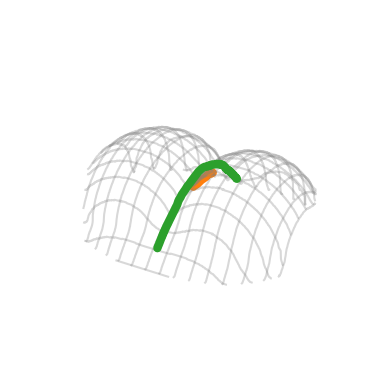

24


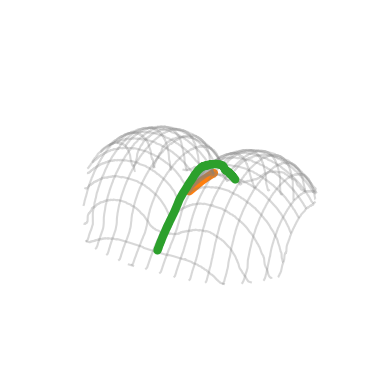

25


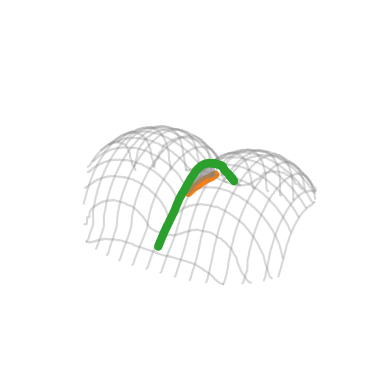

26


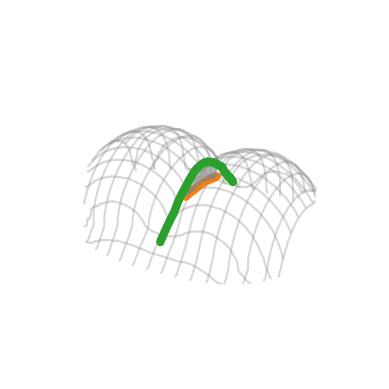

27


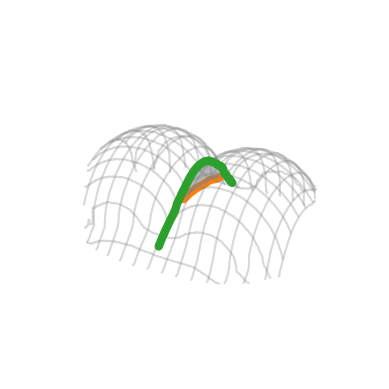

28


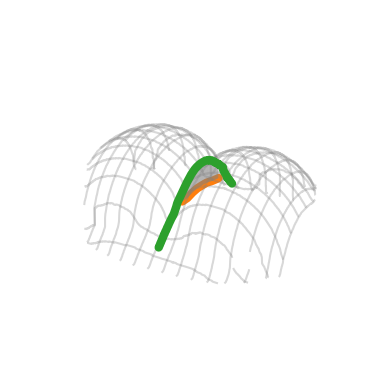

In [20]:
export_folder_name = 'furrow_3d_illu'
create_folder(export_folder_name)

mem_septum_tip_phase2 = 'mem_septum_tip_phase2.csv'
mem_septum_tip_phase2 = pd.read_csv(mem_septum_tip_phase2)
# mem_septum_tip_phase2['Frame'] -= 5
# print(mem_septum_tip_phase2['Frame'])
# mem_septum_tip_phase2_frames = mem_septum_tip_phase2['Frame'].unique()
# mem_septum_tip_phase2_frames = np.sort(mem_septum_tip_phase2_frames)


for f in range(fs):
# for f in frames_to_show_in_figure1:
# for f in [frames_to_show_in_figure1[2]]:
# # for f in range(fs):
# for f in [13]:
        
    print(f)
    fig, ax = plt.subplots(subplot_kw={'projection': '3d'})
    X = np.arange(xs)
    Y = np.arange(ys)
    X, Y = np.meshgrid(X, Y)
    ax.plot_wireframe(X, Y, height[f], rcount=15, ccount=15, zorder=-5, color='grey', alpha=0.3)

    if f <f_septum1:
        furrow_color = 'tab:blue'
    else:
        furrow_color = 'tab:green'

    if not np.isnan(fu_range[f][0]):
        ax.plot(fu_coord[f][1][1][int(fu_range[f][0]):int(fu_range[f][1]+1)],
                fu_coord[f][1][0][int(fu_range[f][0]):int(fu_range[f][1]+1)],
                fu_h_para_nparray[f][int(fu_range[f][0]):int(fu_range[f][1]+1)],
                color=furrow_color, zorder=10, lw=6, solid_capstyle='round')
    
    if f+1 in list(mem_septum_tip_phase2['Frame']):
        subset = mem_septum_tip_phase2[mem_septum_tip_phase2['Frame'] == f+1]
        subset = subset.sort_values(['X','Slice'])
        mem_septum_x, mem_septum_y, mem_septum_z = np.array(subset['Slice']), np.array(subset['X']/pixel_size), np.array(hs-subset['Y']/pixel_size)
        ax.plot(mem_septum_x, mem_septum_y, mem_septum_z, color='tab:orange', zorder=-20, lw=6, solid_capstyle='round')

        mem_septum_y_new = np.arange(mem_septum_y[0], mem_septum_y[-1], 2)
        mem_septum_z_new = np.interp(x=mem_septum_y_new, xp=mem_septum_y, fp=mem_septum_z)
        mem_septum_x_new = np.interp(x=mem_septum_y_new, xp=mem_septum_y, fp=mem_septum_x)
        mem_septum_ztop_new = height[f, mem_septum_y_new.astype('int'), mem_septum_x_new.astype('int')]

        ax.fill_between(mem_septum_x_new, mem_septum_y_new, mem_septum_z_new,
                        mem_septum_x_new, mem_septum_y_new, mem_septum_ztop_new,
                        zorder=-10, facecolors='grey', mode='auto', shade=False, alpha=.75)

    ax.set_aspect('equal')
    # ax.set_xlim(0, xs)
    # ax.set_ylim(0, ys)
    # ax.set_zlim(0, hs)
    ax.set_axis_off()
    plt.savefig(export_folder_name + '\\f' + str(f+1) + '.png', bbox_inches='tight', dpi=500, pad_inches=0)
    plt.show()
